# Nonconvex optimization

This tutorial focus on some common optimization method.

Reference includes Deepmind least-square tutorials:

https://github.com/google-deepmind/mujoco

UCLA lecture notes and stanford lecture notes for constrained nonlinear optimization problem:

https://www.seas.ucla.edu/~vandenbe/133B/lectures/nllseq.pdf

https://stanford.edu/class/cme338/notes/notes11-BCL.pdf


In [1]:
import mujoco.minimize
import numpy as np
import jax
import jax.numpy as jnp
import matplotlib.pyplot as plt
import matplotlib.patches
import matplotlib.lines

## Newton method for nonconvex optimization

Let's look at an unconstrained nonconvex optimization in the form (For now, forget the notation we used in the previous cells)
$
\begin{align}
\underset{x}{\text{minimize}} \ &f(x) \nonumber \\
\end{align}
$

When $f(x)$ is strongly convex, we can iteratively apply Newton step:  
$x_{k+1} = x_k - H^{-1}_k g_k$, where $g_k$ is the gradient and $H_k$ is the Hessian.

Newtwon step can be viewed as minimizer of the quadratic approximation of the original function $x(x)$
$$x_{k+1} = \underset{x}{\text{minimize}} \ \hat{f}(x) \approx f(x_k) + g_k^T (x - x_k) + \frac{1}{2}(x - x_k)^T H_k (x - x_k)$$

However, for non-strongly convex objective, H can be non-positive definite. Therefore, $x_{k+1} = x_k - H^{-1}_k g_k$ might not be minimizer of local quadratic approximation function. We handle this by **Levenberg-Marquardt regularization**:
$$ x_{k+1} = \underset{x}{\text{minimize}} \ \hat{f}(x) + \mu \|x-x_k\|^2. $$
The updates is explicitly given by $ x_{k+1} = x_k - (H_k + \mu I)^{-1} g_k$.

The regularization prevent the next step too far from the current step, in this sense, $\mu$ serve somewhat like the step size in the gradient descent. When $\mu$ is large enough, the problem also becomes strongly convex.

## Gauss-Newton approximation
Calculate the Hessian can be expensive, we can acchieve addition simplification by exploiting the structure.
Assuming objective can be decompose to $f(x) = \frac{1}{2} r(x)^T r(x)$, which is called the least square problem and $r(x): \mathbb{R}^n \rightarrow \mathbb{R}^m$, is called the residual. 

Letting $J = \nabla r(x)$ be the Jacobian, we have
$$
\begin{align}
g &= J^Tr \nonumber \\
H &= J^TJ + \nabla J \cdot r \nonumber
\end{align}
$$
The Gauss-Newton approximation of the Hessian $H$ involves dropping the second term: $H \approx H_{GN}= J^TJ$. This approximation has two obvious benefits:
1. The approximate Hessian $H_{GN}$, being a matrix square, cannot be negative-definite and is at least semidefinite. For any $\mu \gt 0$, the LM-regularized matrix $H_{GN} + \mu I$ is guaranteed to be Symmetric Positive Definite (SPD).
2. In order to compute $H_{GN}$ we only require the Jacobian $J$. In other words, we get the goodness of 2nd-order optimization with only 1st-order derivatives.

## Toy examples

We are going to test the efficiency of Gauss-Newton method compared to full Newton and gradient descent.

In [2]:
def plot_2D(residual, name, plot_range, true_minimum=None, trace=None, bounds=None, equality_constraints=None):
    n = 400
    x_range, y_range = plot_range
    x_grid = np.linspace(x_range[0], x_range[1], n)
    y_grid = np.linspace(y_range[0], y_range[1], n)
    X, Y = np.meshgrid(x_grid, y_grid)

    R = residual(np.stack((X, Y)))
    Z = 0.5 * np.sum(R**2, axis=0)

    fig = plt.figure(figsize=(10, 10))
    cntr_levels = np.linspace(0, np.log1p(Z.max()), 30)
    plt.contour(X, Y, np.log1p(Z), cntr_levels, linewidths=0.5)
    plt.title(name)
    plt.xlabel('x')
    plt.ylabel('y')
    plt.rc('font', family='serif')

    # Draw bounds.
    hbounds = None
    if bounds is not None:
        lower, upper = bounds
        width = upper[0] - lower[0]
        height = upper[1] - lower[1]
        rect = matplotlib.patches.Rectangle(lower, width, height, edgecolor='blue', facecolor='none',
                        fill=False, lw=1)
        hbounds = fig.axes[0].add_patch(rect)

    # Draw equality constraints
    hefc = None
    if equality_constraints is not None:
        E = equality_constraints(np.stack((X, Y))).squeeze()
        plt.contour(X, Y, E, [0], linewidths=2.0, colors='orange')
        hefc = matplotlib.lines.Line2D([], [], color='orange', linewidth=2.0)

    # Draw initial point
    point_spec = {'markersize': 10, 'markeredgewidth': 2, 'fillstyle': 'none',
                    'marker': 'o', 'linestyle': 'none'}
    curve_spec = {'marker': 'o', 'markersize': 2, 'linewidth': 1.5,
                    'color': 'red', 'alpha':0.5}
    final_spec = {'marker': 'o', 'markersize': 4, 'color': 'green',
                    'linestyle': 'none'}
    # Draw global minimum
    hmin = None
    if true_minimum is not None:
        hmin = plt.plot(true_minimum[0], true_minimum[1], color='pink', **point_spec)

    def add_curve(t):
        x0 = plt.plot(t[0, 0], t[0, 1], color='grey', **point_spec)
        traj = plt.plot(t[:, 0], t[:, 1], **curve_spec)
        final = plt.plot(t[-1, 0], t[-1, 1], **final_spec)
        return x0, traj, final

    handles = []
    labels = []
    if trace is not None:
        if isinstance(trace, list):
            for t in trace:
                x0, traj, final = add_curve(t)
        else:
            x0, traj, final = add_curve(trace)

        handles = [x0[0], traj[0], final[0]]
        labels = ['$x_0$', 'optimization trace', 'solution']
   
    if hmin is not None:
        handles.append(hmin)
    if hbounds is not None:
        handles.append(hbounds)
        labels.append('box bounds')
    if hefc is not None:
        handles.append(hefc)
        labels.append('equality constraints')
    
    if len(handles) > 0:
        plt.legend(handles, labels)

    plt.show()

We will use two test functions design to test the effectiveness of optimization method.
The first one we use is the [Rosenbrock test function](https://en.wikipedia.org/wiki/Rosenbrock_function), which is given by

$f(x,y) = \frac{1}{2}r^T r$, with residual $r(x,y)=\begin{pmatrix} 1-x \\ 10\cdot(y-x^2) \end{pmatrix}$

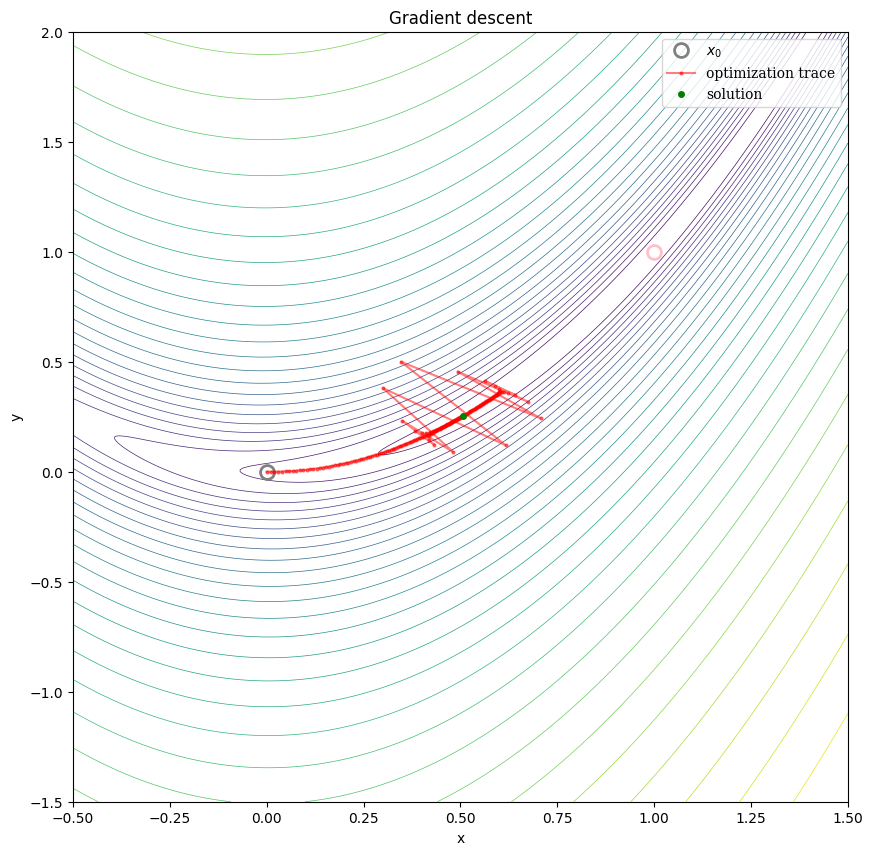

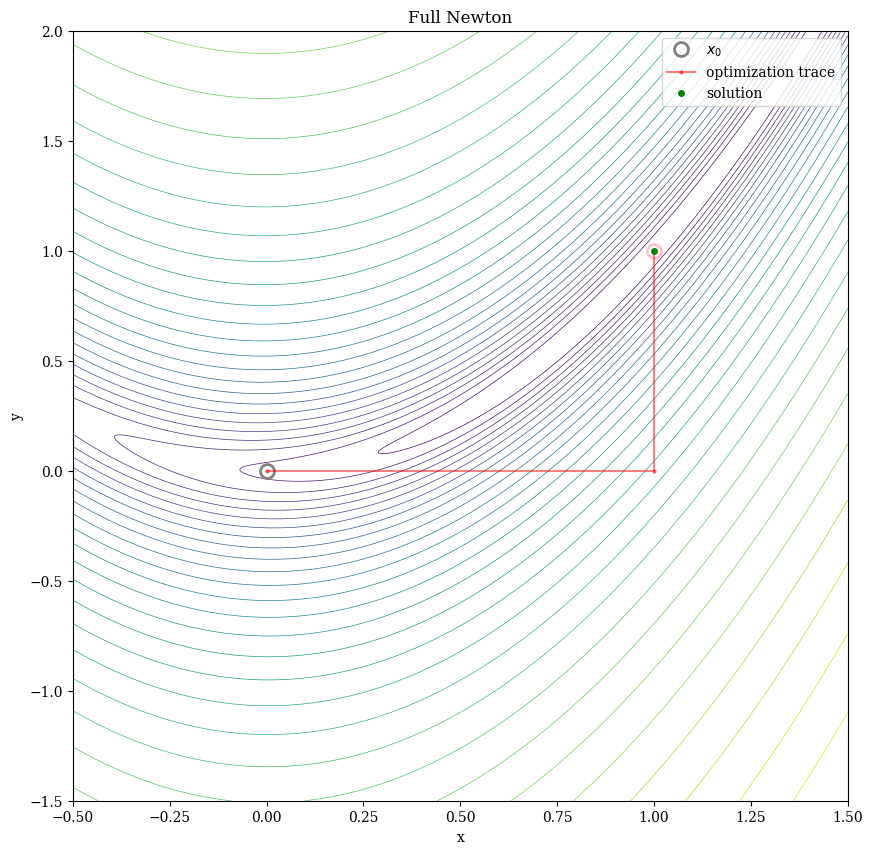

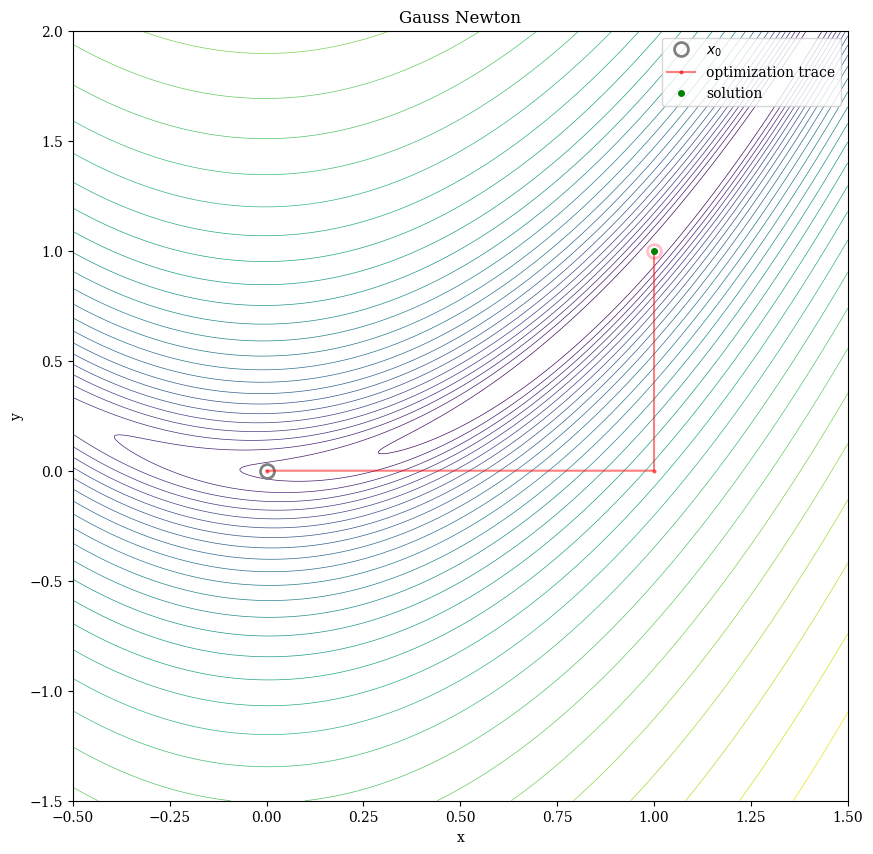

In [3]:
def rosenbrock_jax(x):
    return jnp.array([1 - x[0], 10 * (x[1] - x[0] ** 2)])

plot_range = (np.array((-0.5, 1.5)), np.array((-1.5, 2.)))
minimum = (1, 1)

def gradient_descent(residual_fn, step_size, x0, max_it=int(200)):
    jac = jax.jacobian(residual_fn)
    @jax.jit
    def grad(x):
        return jac(x).T @ residual_fn(x)
    xs = [x0]
    for i in range(max_it):
        xs.append(xs[-1] - step_size * grad(xs[-1]))
    return np.array(xs)

def full_newton(residual_fn, step_size, x0, mu=0, max_it=int(200)):
    def f(x):
        return jnp.sum(residual_fn(x)**2)
    grad = jax.jit(jax.grad(f))
    hess = jax.jit(jax.hessian(f))
    xs = [x0]
    for i in range(max_it):
        xs.append(xs[-1] - step_size * jax.numpy.linalg.inv(hess(xs[-1]) + mu* jnp.diag(jnp.ones_like(xs[-1]))) @ grad(xs[-1]))
    return np.array(xs)

def gauss_newton(residual_fn, step_size, x0, mu=0, max_it=int(200)):
    jac = jax.jacobian(residual_fn)

    @jax.jit
    def grad(x):
        return jac(x).T @ residual_fn(x)
    @jax.jit
    def hess(x):
        return jac(x).T @ jac(x)
    xs = [x0]
    for i in range(max_it):
        xs.append(xs[-1] - step_size * jax.numpy.linalg.inv(hess(xs[-1]) + mu* jnp.diag(jnp.ones_like(xs[-1]))) @ grad(xs[-1]))
    return np.array(xs)

x0 = np.array([0.0, 0.0])

plot_2D(rosenbrock_jax, 'Gradient descent', plot_range, minimum, trace=gradient_descent(rosenbrock_jax, step_size=0.01, x0=x0))
plot_2D(rosenbrock_jax, 'Full Newton', plot_range, minimum, trace=full_newton(rosenbrock_jax, step_size=1, mu=0, x0=x0, max_it=50))
plot_2D(rosenbrock_jax, 'Gauss Newton', plot_range, minimum, trace=gauss_newton(rosenbrock_jax, step_size=1, mu=0, x0=x0, max_it=50))

A somewhat more elaborate example is the [Beale function](https://en.wikipedia.org/wiki/Test_functions_for_optimization#Test_functions_for_single-objective_optimization):

$f(x,y)=r^Tr,$ with the residual
$r(x,y)=\begin{pmatrix} 1.5-x+xy \\ 2.25-x+xy^2 \\ 2.625-x+xy^3 \end{pmatrix}$.

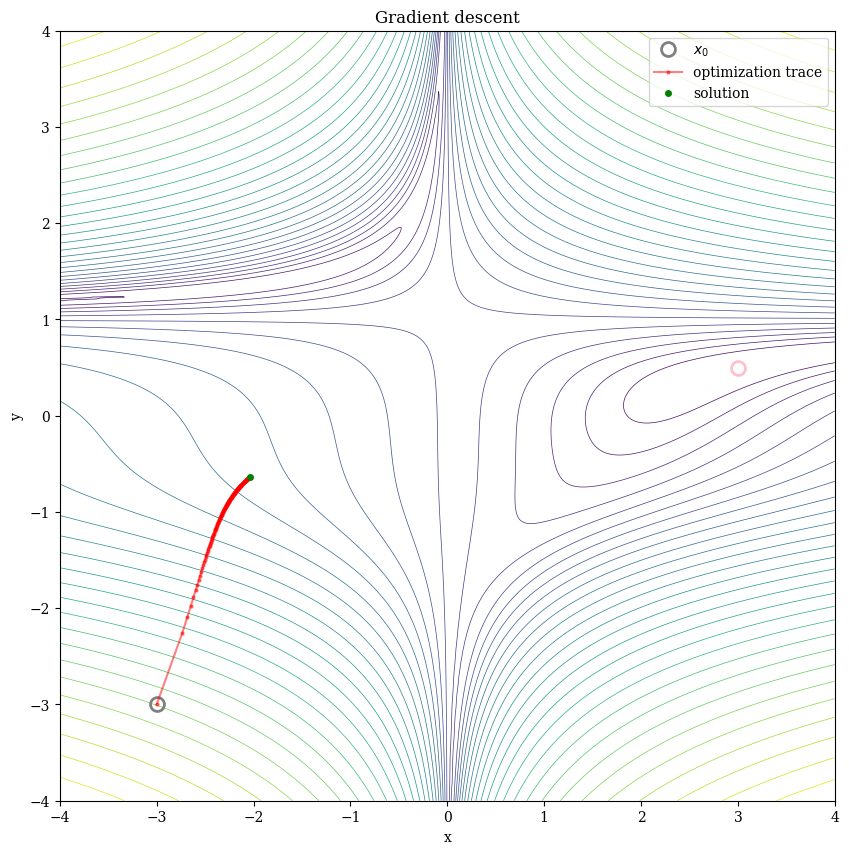

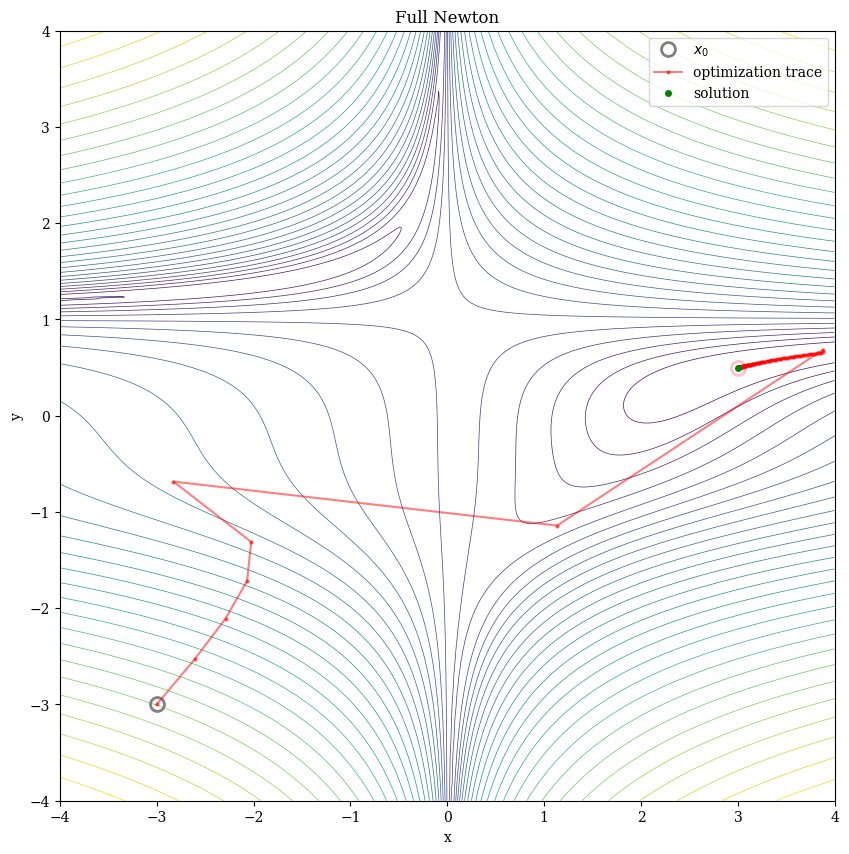

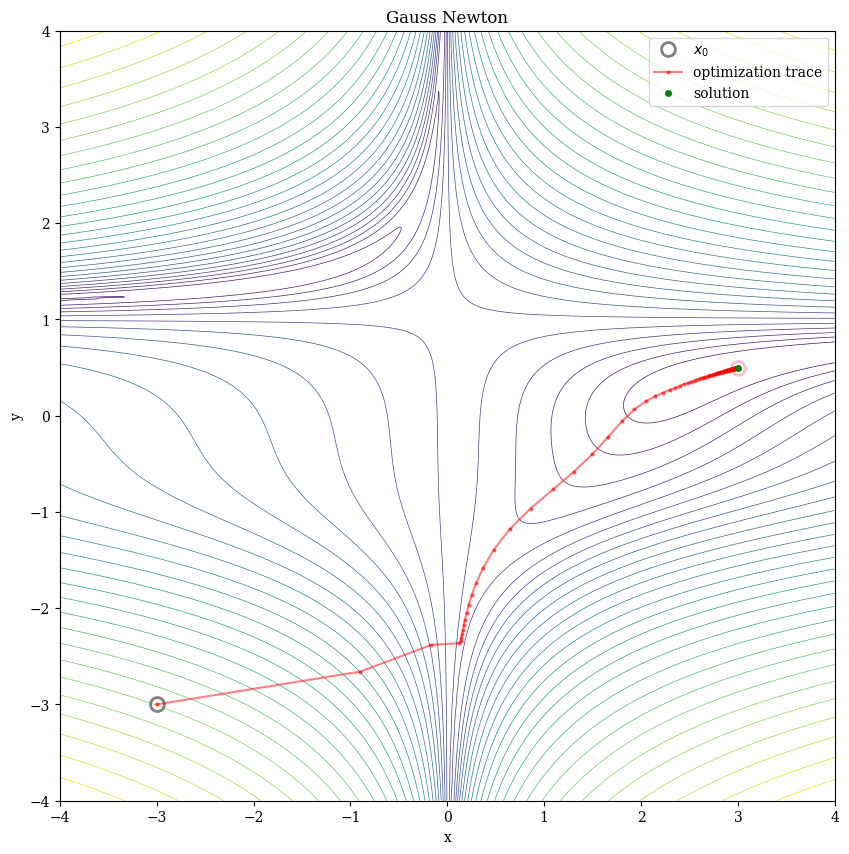

In [4]:
def beale_jax(x):
  return jnp.array((1.5-x[0]+x[0]*x[1],
                   2.25-x[0]+x[0]*x[1]*x[1],
                   2.625-x[0]+x[0]*x[1]*x[1]*x[1]))

plot_range = (np.array((-4., 4.)), np.array((-4., 4.)))
minimum = (3., 0.5)

x0 = np.array((-3.0, -3.0))
plot_2D(beale_jax, 'Gradient descent', plot_range, minimum, trace=gradient_descent(beale_jax, step_size=0.0001, x0=x0))
plot_2D(beale_jax, 'Full Newton', plot_range, minimum, trace=full_newton(beale_jax, step_size=1, mu=5, x0=x0))
plot_2D(beale_jax, 'Gauss Newton', plot_range, minimum, trace=gauss_newton(beale_jax, step_size=1, mu=5, x0=x0))

iter: 0    y: 4080       log10mu: -inf  ratio: 1        dx: 2.9      reduction: 4.1e+03
iter: 1    y: 11.2       log10mu: -inf  ratio: 0.6      dx: 2.3      reduction: 3.8    
iter: 2    y: 7.371      log10mu: -0.9  ratio: 0.047    dx: 1.6      reduction: 0.26   
iter: 3    y: 7.109      log10mu: -0.8  ratio: 1        dx: 0.38     reduction: 4.7    
iter: 4    y: 2.408      log10mu: -0.9  ratio: 1.4      dx: 0.51     reduction: 1.3    
iter: 5    y: 1.155      log10mu: -1.1  ratio: 1.5      dx: 0.57     reduction: 0.83   
iter: 6    y: 0.3266     log10mu: -1.5  ratio: 0.55     dx: 0.62     reduction: 0.16   
iter: 7    y: 0.1643     log10mu: -1.5  ratio: 1        dx: 0.47     reduction: 0.16   
iter: 8    y: 0.0006372  log10mu: -2.3  ratio: 0.99     dx: 0.077    reduction: 0.00063
iter: 9    y: 6.587e-06  log10mu: -3.9  ratio: 1        dx: 0.0047   reduction: 6.6e-06
iter: 10   y: 1.542e-11  log10mu: -inf  ratio: 1        dx: 6.2e-06  reduction: 1.5e-11
iter: 11   y: 8.581e-24  log10mu

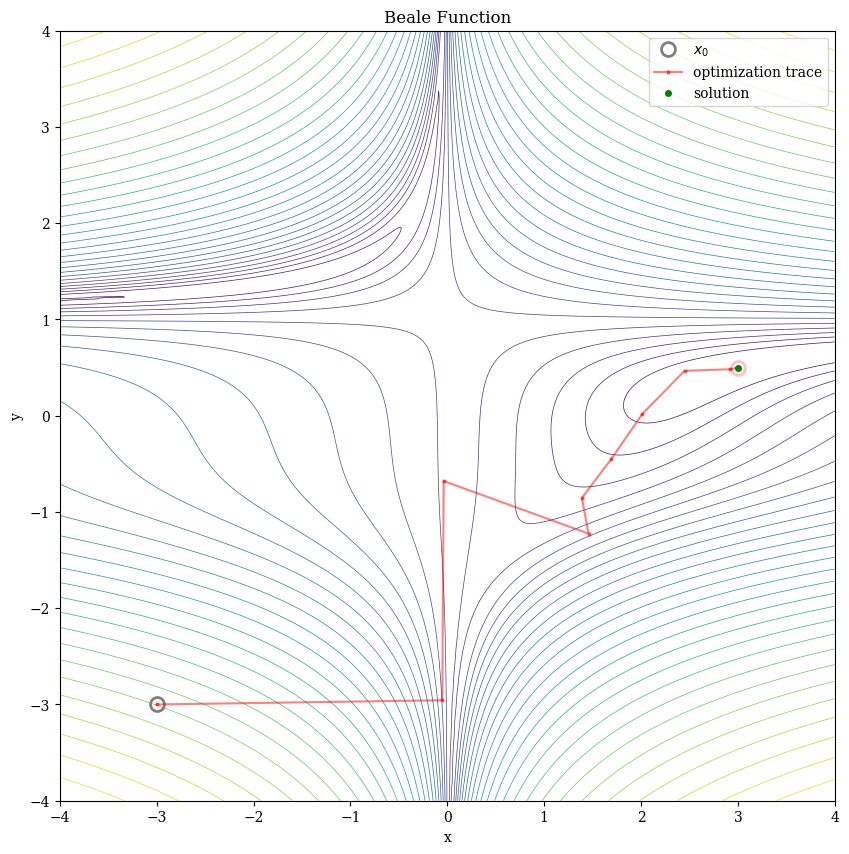

In [5]:
# Mujoco's least square require residual function to return float64 numpy array. Moreover, the residual should support batch inputs.
def beale(x):
    return np.stack((1.5-x[0, :]+x[0, :]*x[1, :],
                    2.25-x[0, :]+x[0, :]*x[1, :]*x[1, :],
                    2.625-x[0, :]+x[0, :]*x[1, :]*x[1, :]*x[1, :]))

x, bl_trace = mujoco.minimize.least_squares(x0, beale)
plot_2D(beale, 'Beale Function', plot_range, minimum, trace=np.asarray([t.candidate for t in bl_trace]))

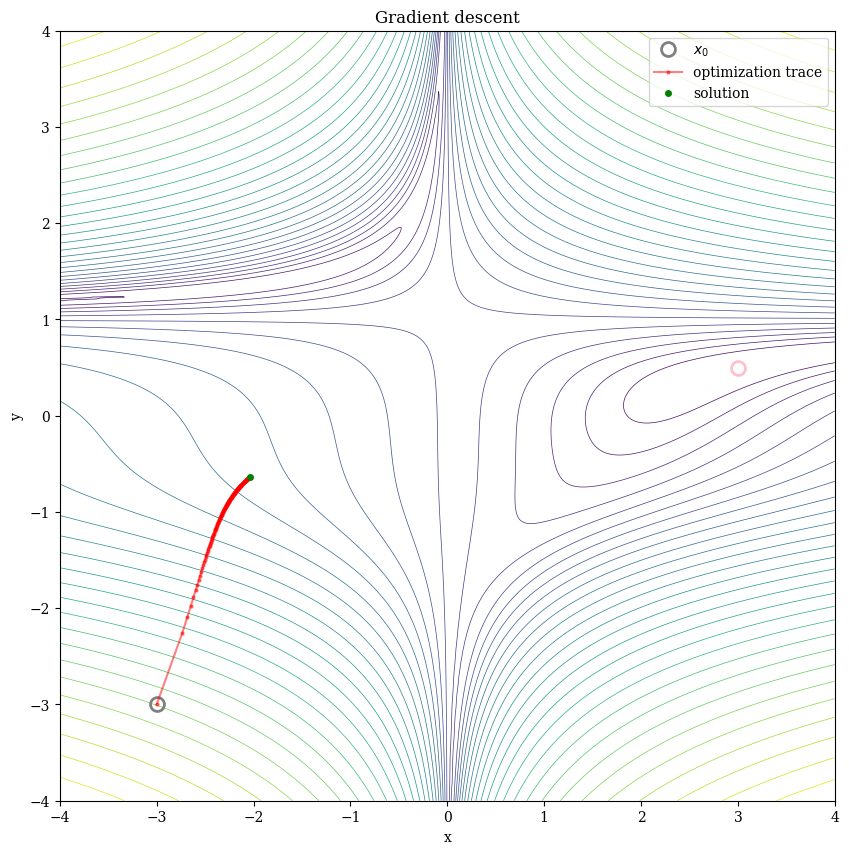

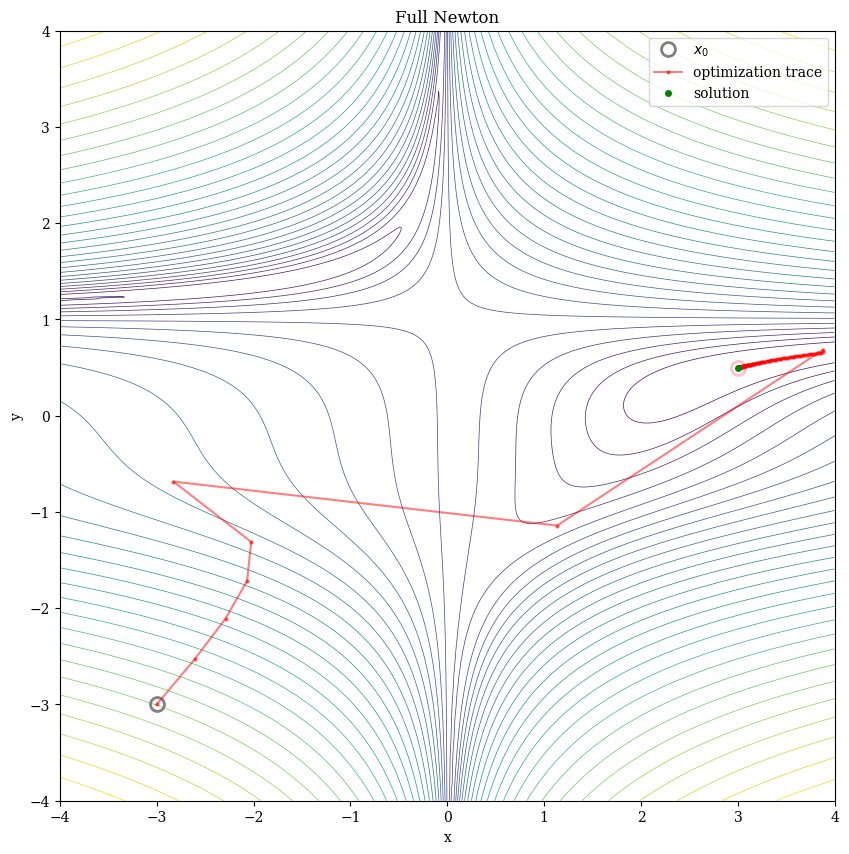

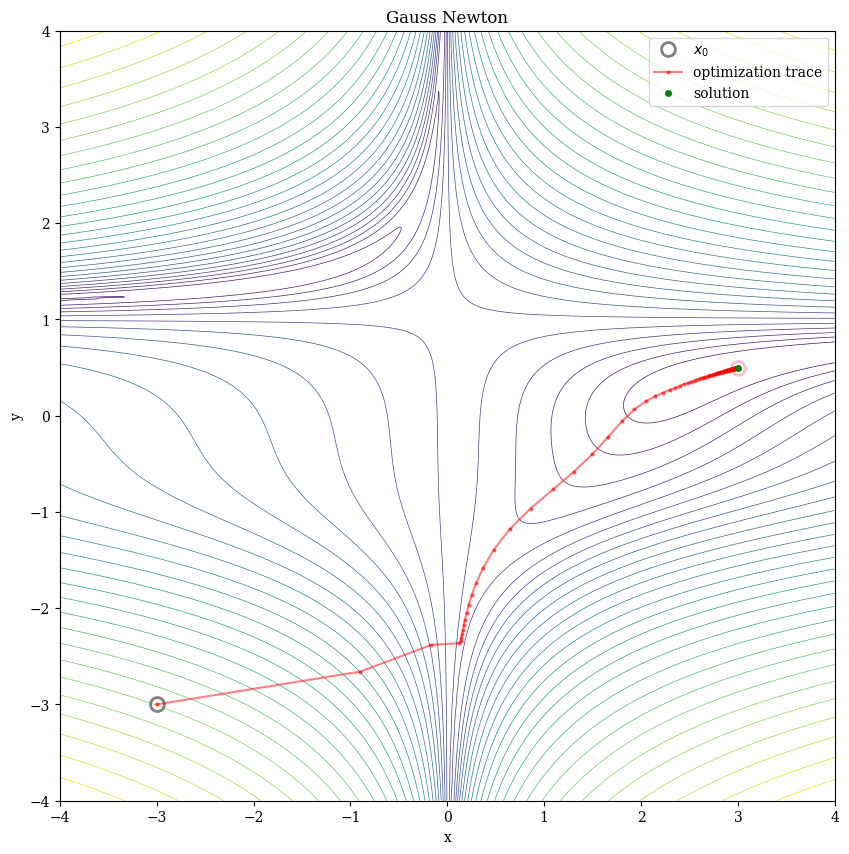

In [6]:
def beale(x):
  return jnp.array((1.5-x[0]+x[0]*x[1],
                   2.25-x[0]+x[0]*x[1]*x[1],
                   2.625-x[0]+x[0]*x[1]*x[1]*x[1]))

plot_range = (np.array((-4., 4.)), np.array((-4., 4.)))
minimum = (3., 0.5)

x0 = np.array((-3.0, -3.0))
plot_2D(beale, 'Gradient descent', plot_range, minimum, trace=gradient_descent(beale, step_size=0.0001, x0=x0))
plot_2D(beale, 'Full Newton', plot_range, minimum, trace=full_newton(beale, step_size=1, mu=5, x0=x0))
plot_2D(beale, 'Gauss Newton', plot_range, minimum, trace=gauss_newton(beale, step_size=1, mu=5, x0=x0))

## Constrained optimization

Let's consider optimization with equality constraints

$
\begin{align}
\underset{x}{\text{minimize}} \ &f(x) \nonumber \\
s.t. \ &g(x) = 0 \nonumber \\
\end{align}
$

### Penalty method

One way is to deal with equality constaints is turn the constraints into loss and solve sequence of optimization problem

$
\begin{align}
\underset{x}{\text{minimize}} \ &f(x) + \frac{\rho}{2} \|g(x)\|_2^2 \nonumber , \\
\end{align}
$
or equivalently

$
\begin{align}
\underset{x}{\text{minimize}} \  \frac{1}{2}\|\begin{bmatrix} r(x)\\ \sqrt{\rho} g(x) \end{bmatrix}\|^2 \nonumber , \\
\end{align}
$

and we increase $\rho$ sequentially.

Minmize beale function with constraints rosenbrock = 1.
We will visualize the progress for each sub-routine and then show the entire trace

iter: 0    y: 7.103      log10mu: -inf  ratio: 0.21     dx: 1.5      reduction: 1.1    
iter: 1    y: 5.975      log10mu: -0.9  ratio: 0.13     dx: 1.3      reduction: 0.7    
iter: 2    y: 5.273      log10mu: -0.8  ratio: 0.71     dx: 0.52     reduction: 3.5    
iter: 3    y: 1.773      log10mu: -0.5  ratio: 0.34     dx: 0.86     reduction: 0.48   
iter: 4    y: 1.294      log10mu: -0.5  ratio: 0.94     dx: 0.25     reduction: 0.77   
iter: 5    y: 0.5219     log10mu: -0.6  ratio: 0.5      dx: 0.38     reduction: 0.032  
iter: 6    y: 0.4904     log10mu: -0.6  ratio: 0.63     dx: 0.078    reduction: 0.0046 
iter: 7    y: 0.4858     log10mu: -0.6  ratio: 3.7      dx: 0.014    reduction: 0.00027
iter: 8    y: 0.4855     log10mu: -0.6  ratio: 0.047    dx: 0.11     reduction: 0.00019
iter: 9    y: 0.4853     log10mu: -0.5  ratio: 0.081    dx: 0.079    reduction: 0.00019
iter: 10   y: 0.4852     log10mu:  0.5  ratio: 0.05     dx: 0.0025   reduction: 2.3e-06
iter: 11   y: 0.4852     log10mu

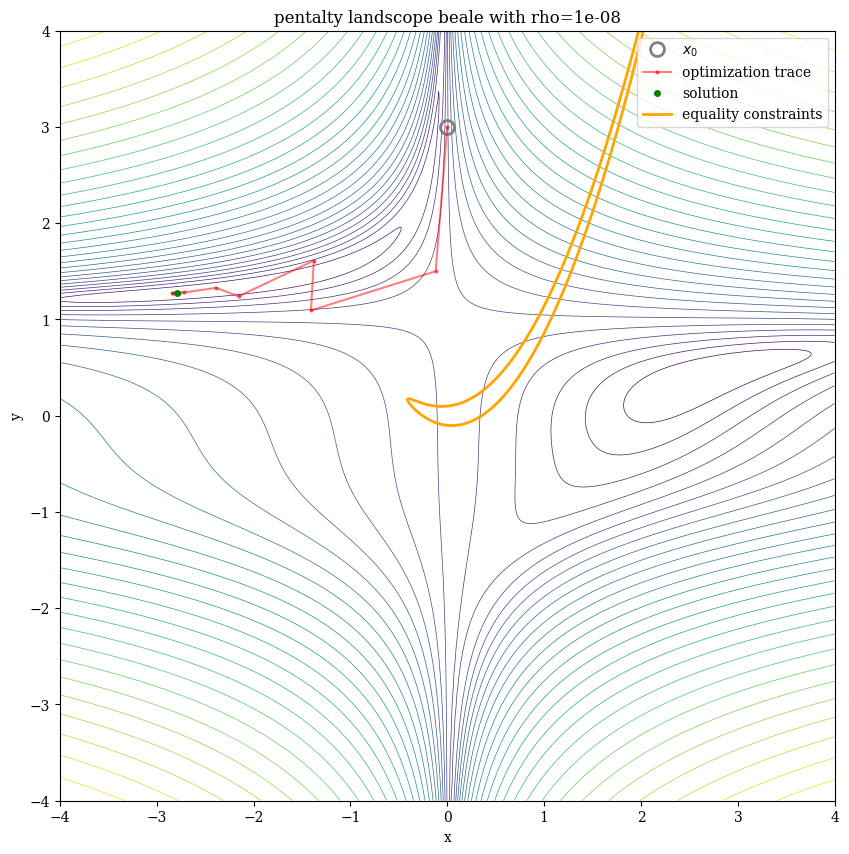

iter: 0    y: 1.277      log10mu: -inf  ratio: 0.9      dx: 0.55     reduction: 0.68   
iter: 1    y: 0.6004     log10mu: -inf  ratio: 0.52     dx: 0.35     reduction: 0.035  
iter: 2    y: 0.5654     log10mu: -1.4  ratio: 0.056    dx: 0.19     reduction: 0.0005 
iter: 3    y: 0.5649     log10mu: -1.3  ratio: 0.83     dx: 0.12     reduction: 0.0043 
iter: 4    y: 0.5606     log10mu: -0.6  ratio: 0.046    dx: 0.036    reduction: 2.7e-05
iter: 5    y: 0.5605     log10mu: -0.5  ratio: 0.63     dx: 0.018    reduction: 0.00011
iter: 6    y: 0.5604     log10mu:  4.3  ratio: 0.36     dx: 2e-06    reduction: 2.9e-08
iter: 7    y: 0.5604     log10mu:  4.5  ratio: 0.066    dx: 7.6e-07  reduction: 1.2e-09
Terminated after 7 iterations: norm(dx) < tol. y: 0.5604, Residual evals: 130
total time 24.0ms of which residual 90.2%


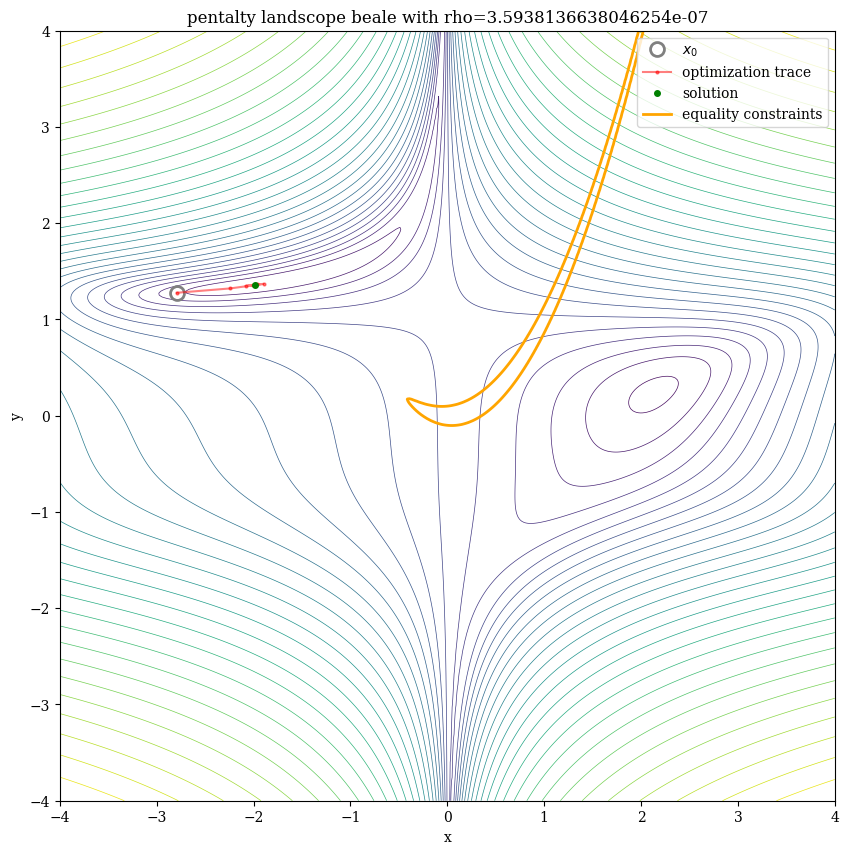

iter: 0    y: 1.262      log10mu: -inf  ratio: 0.9      dx: 0.31     reduction: 0.61   
iter: 1    y: 0.654      log10mu: -inf  ratio: 0.68     dx: 0.16     reduction: 0.03   
iter: 2    y: 0.624      log10mu: -inf  ratio: 2.4      dx: 0.014    reduction: 0.00057
iter: 3    y: 0.6235     log10mu:  1.6  ratio: 0.18     dx: 0.00019  reduction: 4.8e-07
iter: 4    y: 0.6235     log10mu:  3.2  ratio: 0.18     dx: 4.5e-06  reduction: 5.9e-09
iter: 5    y: 0.6235     log10mu:  3.3  ratio: 0.32     dx: 3.4e-05  reduction: 7.5e-07
iter: 6    y: 0.6235     log10mu:  3.3  ratio: 0.29     dx: 3.3e-05  reduction: 6.5e-07
iter: 7    y: 0.6235     log10mu:  4.1  ratio: 0.097    dx: 2.9e-06  reduction: 1e-08  
iter: 8    y: 0.6235     log10mu:  4.2  ratio: 0.11     dx: 5.3e-06  reduction: 5e-08  
iter: 9    y: 0.6235     log10mu:  4.3  ratio: 0.41     dx: 1.8e-06  reduction: 2.8e-08
iter: 10   y: 0.6235     log10mu:  4.3  ratio: 0.34     dx: 3.8e-06  reduction: 9.6e-08
iter: 11   y: 0.6235     log10mu

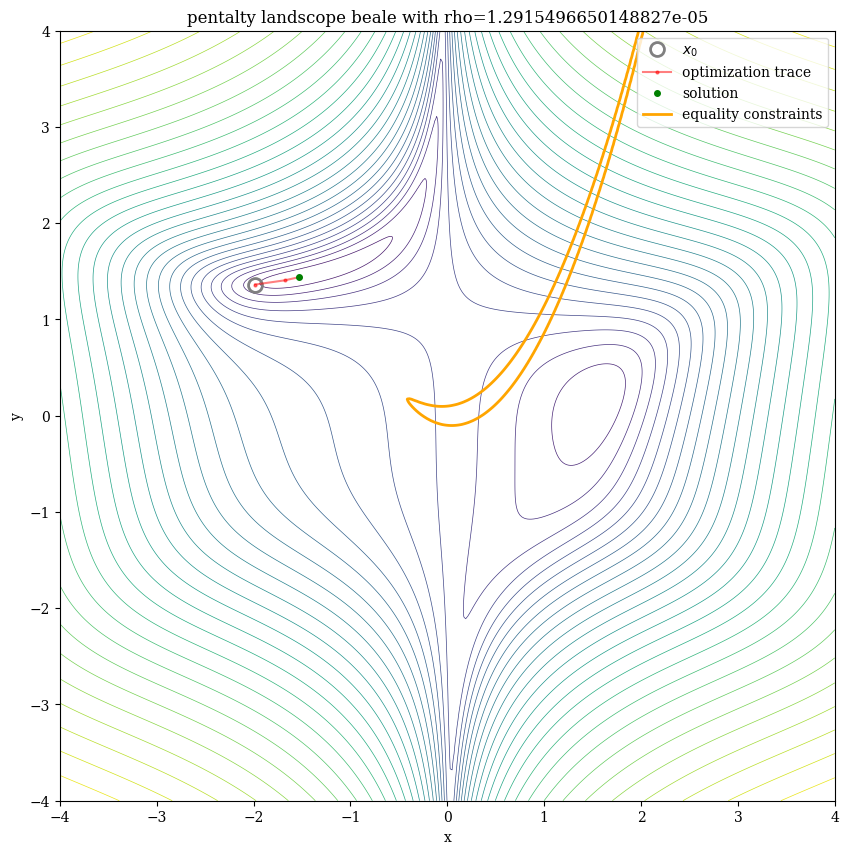

iter: 0    y: 1.06       log10mu: -inf  ratio: 0.9      dx: 0.14     reduction: 0.38   
iter: 1    y: 0.679      log10mu: -inf  ratio: 0.84     dx: 0.065    reduction: 0.017  
iter: 2    y: 0.6623     log10mu:  1.3  ratio: 0.034    dx: 0.0044   reduction: 1.4e-05
iter: 3    y: 0.6623     log10mu:  1.4  ratio: 0.21     dx: 0.0012   reduction: 8.6e-06
iter: 4    y: 0.6623     log10mu:  1.6  ratio: 0.018    dx: 0.00063  reduction: 2.9e-07
iter: 5    y: 0.6623     log10mu:  1.9  ratio: 0.012    dx: 0.00035  reduction: 1.2e-07
iter: 6    y: 0.6623     log10mu:  3.3  ratio: 0.019    dx: 1.3e-05  reduction: 6.5e-09
iter: 7    y: 0.6623     log10mu:  5.0  ratio: 0.18     dx: 4.1e-07  reduction: 3e-09  
Terminated after 7 iterations: norm(dx) < tol. y: 0.6623, Residual evals: 131
total time 26.0ms of which residual 90.2%


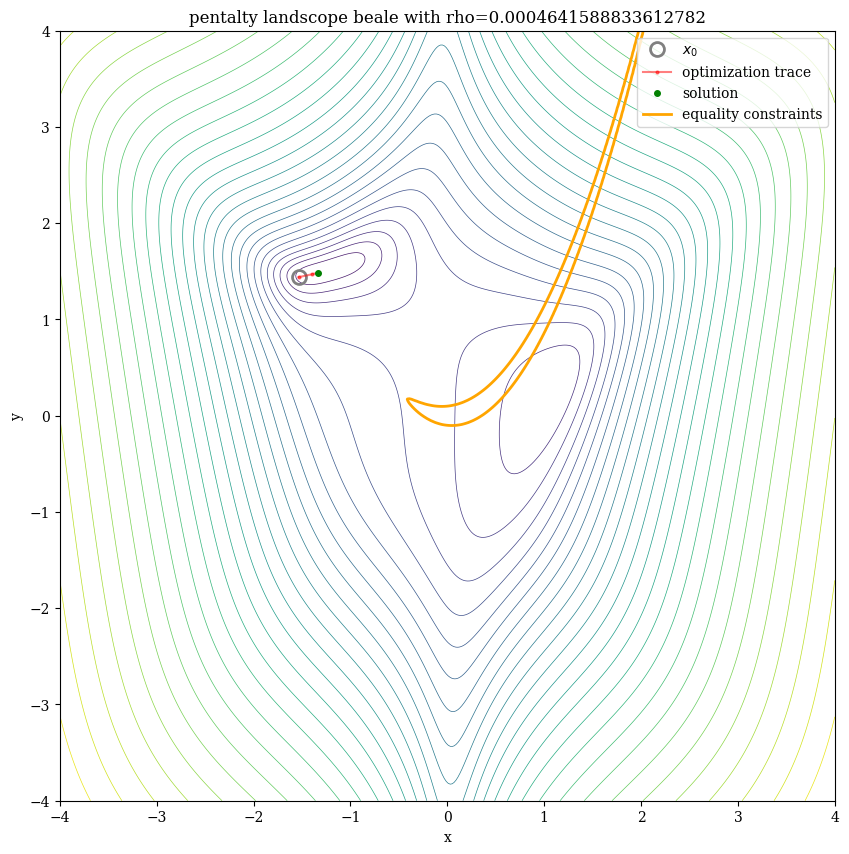

iter: 0    y: 0.9467     log10mu: -inf  ratio: 0.88     dx: 0.068    reduction: 0.24   
iter: 1    y: 0.7068     log10mu: -inf  ratio: 0.21     dx: 0.051    reduction: 0.0041 
iter: 2    y: 0.7027     log10mu:  1.0  ratio: 0.26     dx: 0.036    reduction: 0.0035 
iter: 3    y: 0.6991     log10mu:  1.0  ratio: 0.31     dx: 0.018    reduction: 0.0014 
iter: 4    y: 0.6977     log10mu:  1.0  ratio: 1.3      dx: 0.0052   reduction: 0.00037
iter: 5    y: 0.6974     log10mu:  3.6  ratio: 0.14     dx: 4.1e-06  reduction: 9.7e-09
iter: 6    y: 0.6974     log10mu:  3.7  ratio: 0.78     dx: 4.5e-06  reduction: 7.9e-08
iter: 7    y: 0.6974     log10mu:  3.6  ratio: 0.34     dx: 1.3e-05  reduction: 2.2e-07
iter: 8    y: 0.6974     log10mu:  3.6  ratio: 0.33     dx: 1.3e-05  reduction: 2.1e-07
iter: 9    y: 0.6974     log10mu:  3.6  ratio: 0.17     dx: 2e-05    reduction: 2.7e-07
iter: 10   y: 0.6974     log10mu:  3.7  ratio: 2.3      dx: 1.8e-06  reduction: 3.9e-08
iter: 11   y: 0.6974     log10mu

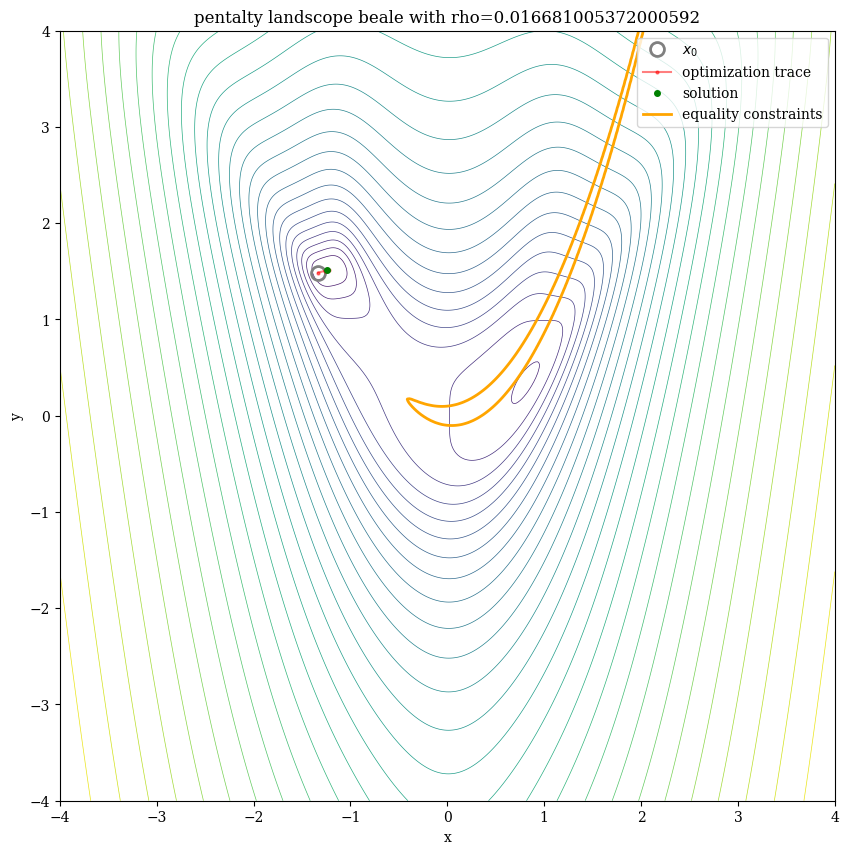

iter: 0    y: 1.394      log10mu:  2.5  ratio: 0.12     dx: 0.023    reduction: 0.022  
iter: 1    y: 1.372      log10mu:  2.6  ratio: 0.26     dx: 0.015    reduction: 0.024  
iter: 2    y: 1.348      log10mu:  2.6  ratio: 0.23     dx: 0.0078   reduction: 0.0056 
iter: 3    y: 1.342      log10mu:  2.7  ratio: 0.39     dx: 0.0036   reduction: 0.0025 
iter: 4    y: 1.34       log10mu:  2.7  ratio: 0.66     dx: 0.001    reduction: 0.00035
iter: 5    y: 1.34       log10mu:  2.7  ratio: 1        dx: 0.0005   reduction: 0.00014
iter: 6    y: 1.339      log10mu:  2.6  ratio: 1.1      dx: 0.00047  reduction: 0.00011
iter: 7    y: 1.339      log10mu:  2.4  ratio: 0.57     dx: 0.00074  reduction: 8.8e-05
iter: 8    y: 1.339      log10mu:  2.5  ratio: 0.067    dx: 0.00083  reduction: 1.5e-05
iter: 9    y: 1.339      log10mu:  2.6  ratio: 0.13     dx: 0.00087  reduction: 4.1e-05
iter: 10   y: 1.339      log10mu:  2.7  ratio: 0.49     dx: 0.00047  reduction: 5.7e-05
iter: 11   y: 1.339      log10mu

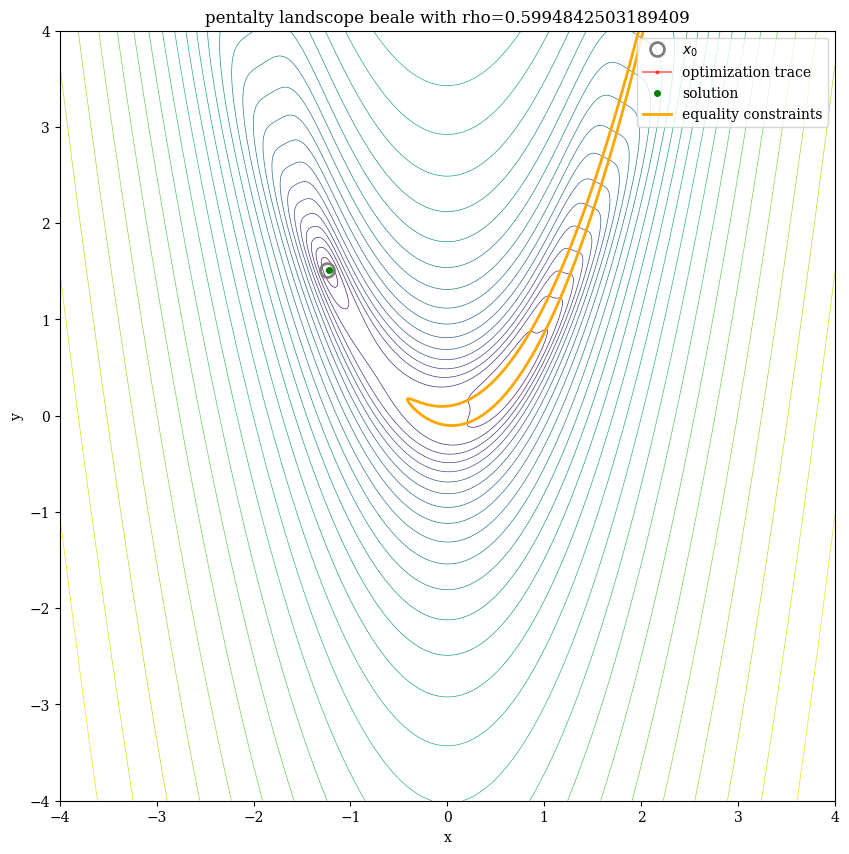

iter: 0    y: 24.24      log10mu:  3.0  ratio: 0.12     dx: 0.025    reduction: 0.075  
iter: 1    y: 24.17      log10mu:  4.1  ratio: 0.19     dx: 0.012    reduction: 0.33   
iter: 2    y: 23.84      log10mu:  4.2  ratio: 0.36     dx: 0.0064   reduction: 0.23   
iter: 3    y: 23.61      log10mu:  4.2  ratio: 0.52     dx: 0.0027   reduction: 0.06   
iter: 4    y: 23.55      log10mu:  4.2  ratio: 0.84     dx: 0.0017   reduction: 0.037  
iter: 5    y: 23.51      log10mu:  4.1  ratio: 0.97     dx: 0.0019   reduction: 0.042  
iter: 6    y: 23.47      log10mu:  3.9  ratio: 0.97     dx: 0.0029   reduction: 0.064  
iter: 7    y: 23.4       log10mu:  3.5  ratio: 0.8      dx: 0.0072   reduction: 0.13   
iter: 8    y: 23.27      log10mu:  3.9  ratio: 0.088    dx: 0.0049   reduction: 0.017  
iter: 9    y: 23.26      log10mu:  4.0  ratio: 0.096    dx: 0.0057   reduction: 0.032  
iter: 10   y: 23.22      log10mu:  4.1  ratio: 0.26     dx: 0.005    reduction: 0.081  
iter: 11   y: 23.14      log10mu

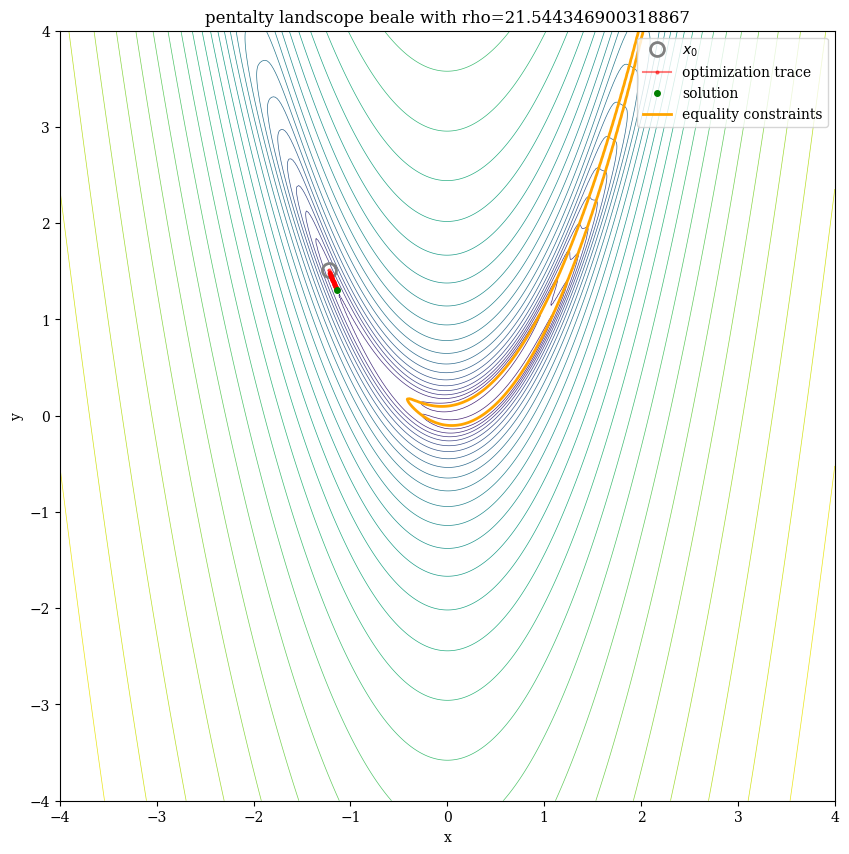

iter: 0    y: 652.2      log10mu:  4.8  ratio: 0.032    dx: 0.015    reduction: 0.44   
iter: 1    y: 651.8      log10mu:  5.5  ratio: 0.11     dx: 0.012    reduction: 4.7    
iter: 2    y: 647        log10mu:  5.6  ratio: 0.29     dx: 0.0082   reduction: 7.9    
iter: 3    y: 639.1      log10mu:  5.6  ratio: 0.4      dx: 0.0046   reduction: 3.4    
iter: 4    y: 635.7      log10mu:  5.6  ratio: 0.62     dx: 0.003    reduction: 2.2    
iter: 5    y: 633.5      log10mu:  5.6  ratio: 0.84     dx: 0.0024   reduction: 1.9    
iter: 6    y: 631.6      log10mu:  5.5  ratio: 0.93     dx: 0.0027   reduction: 2.2    
iter: 7    y: 629.4      log10mu:  5.3  ratio: 0.91     dx: 0.0043   reduction: 3.4    
iter: 8    y: 626        log10mu:  4.9  ratio: 0.28     dx: 0.012    reduction: 3      
iter: 9    y: 623        log10mu:  5.5  ratio: 0.17     dx: 0.0085   reduction: 3.9    
iter: 10   y: 619.1      log10mu:  5.6  ratio: 0.36     dx: 0.0058   reduction: 4.8    
iter: 11   y: 614.2      log10mu

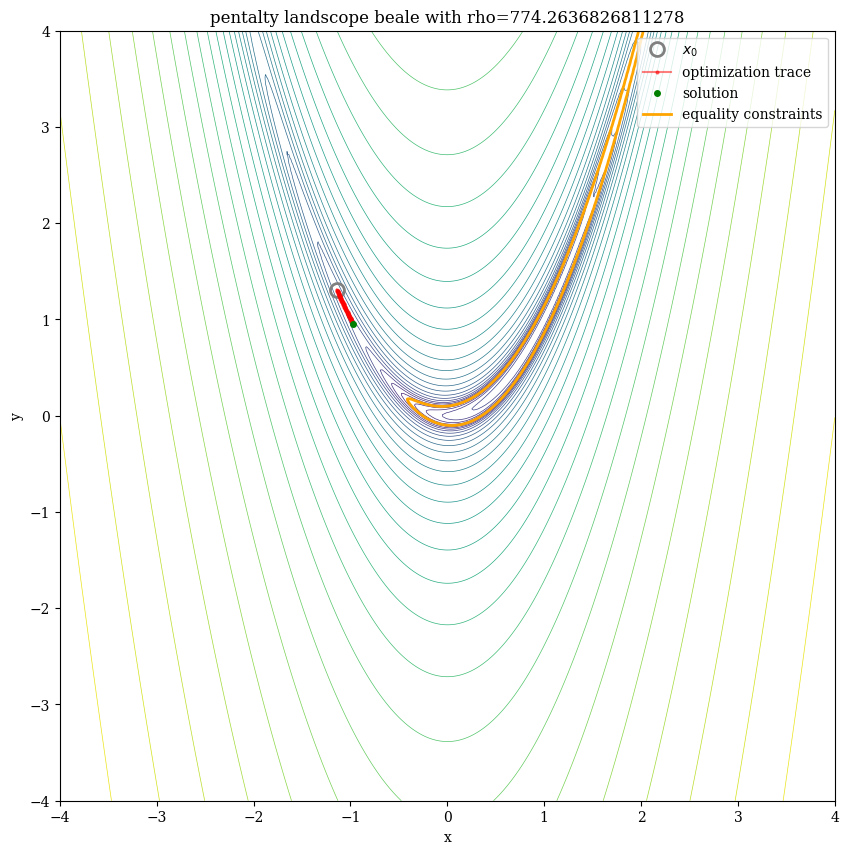

iter: 0    y: 1.251e+04  log10mu:  6.7  ratio: 0.012    dx: 0.011    reduction: 6.7    
iter: 1    y: 1.251e+04  log10mu:  6.8  ratio: 0.15     dx: 0.011    reduction: 1.2e+02
iter: 2    y: 1.238e+04  log10mu:  6.9  ratio: 0.33     dx: 0.0084   reduction: 1.8e+02
iter: 3    y: 1.22e+04   log10mu:  6.9  ratio: 0.49     dx: 0.0051   reduction: 1e+02  
iter: 4    y: 1.21e+04   log10mu:  6.9  ratio: 0.72     dx: 0.0037   reduction: 78     
iter: 5    y: 1.202e+04  log10mu:  6.9  ratio: 0.89     dx: 0.0032   reduction: 71     
iter: 6    y: 1.195e+04  log10mu:  6.8  ratio: 0.96     dx: 0.0038   reduction: 86     
iter: 7    y: 1.186e+04  log10mu:  6.6  ratio: 0.95     dx: 0.0059   reduction: 1.3e+02
iter: 8    y: 1.173e+04  log10mu:  6.2  ratio: 0.54     dx: 0.015    reduction: 2.1e+02
iter: 9    y: 1.152e+04  log10mu:  6.7  ratio: 0.045    dx: 0.011    reduction: 30     
iter: 10   y: 1.149e+04  log10mu:  6.8  ratio: 0.2      dx: 0.011    reduction: 1.6e+02
iter: 11   y: 1.133e+04  log10mu

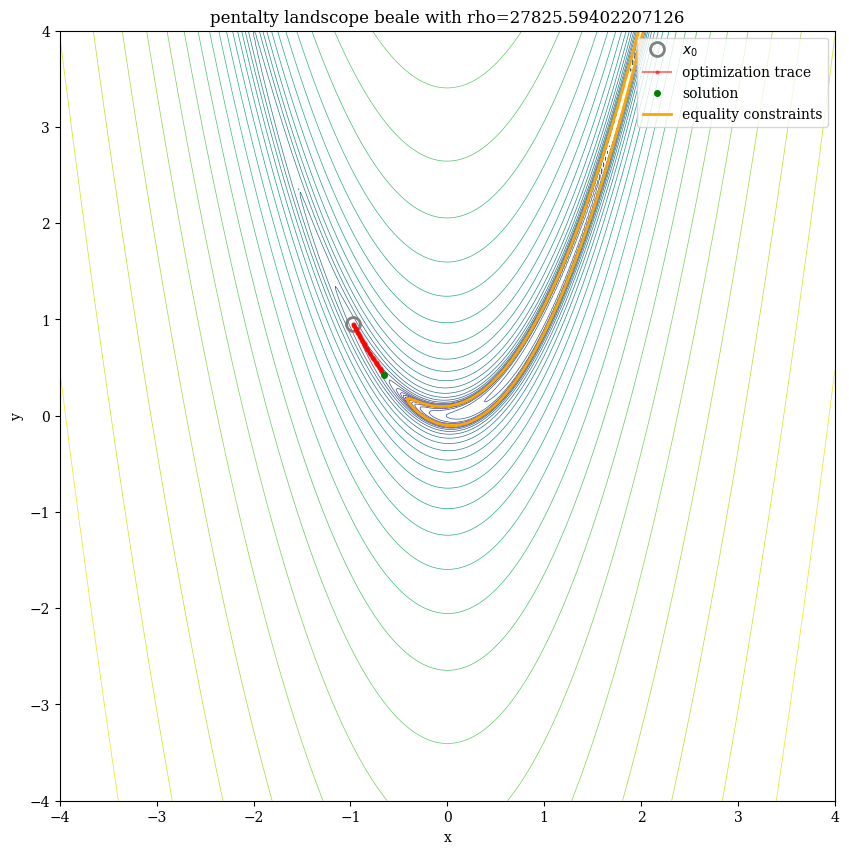

iter: 0    y: 6.509e+04  log10mu:  7.4  ratio: 0.12     dx: 0.019    reduction: 1.2e+03
iter: 1    y: 6.393e+04  log10mu:  7.6  ratio: 0.16     dx: 0.021    reduction: 3e+03  
iter: 2    y: 6.091e+04  log10mu:  7.7  ratio: 0.33     dx: 0.016    reduction: 4.7e+03
iter: 3    y: 5.62e+04   log10mu:  7.7  ratio: 0.46     dx: 0.011    reduction: 3e+03  
iter: 4    y: 5.32e+04   log10mu:  7.7  ratio: 0.65     dx: 0.0085   reduction: 2.4e+03
iter: 5    y: 5.08e+04   log10mu:  7.7  ratio: 0.83     dx: 0.0071   reduction: 2.1e+03
iter: 6    y: 4.866e+04  log10mu:  7.6  ratio: 0.92     dx: 0.0081   reduction: 2.4e+03
iter: 7    y: 4.621e+04  log10mu:  7.4  ratio: 0.9      dx: 0.012    reduction: 3.5e+03
iter: 8    y: 4.274e+04  log10mu:  7.0  ratio: 0.38     dx: 0.03     reduction: 3.6e+03
iter: 9    y: 3.918e+04  log10mu:  7.4  ratio: 0.16     dx: 0.024    reduction: 2.7e+03
iter: 10   y: 3.648e+04  log10mu:  7.5  ratio: 0.32     dx: 0.019    reduction: 4.3e+03
iter: 11   y: 3.218e+04  log10mu

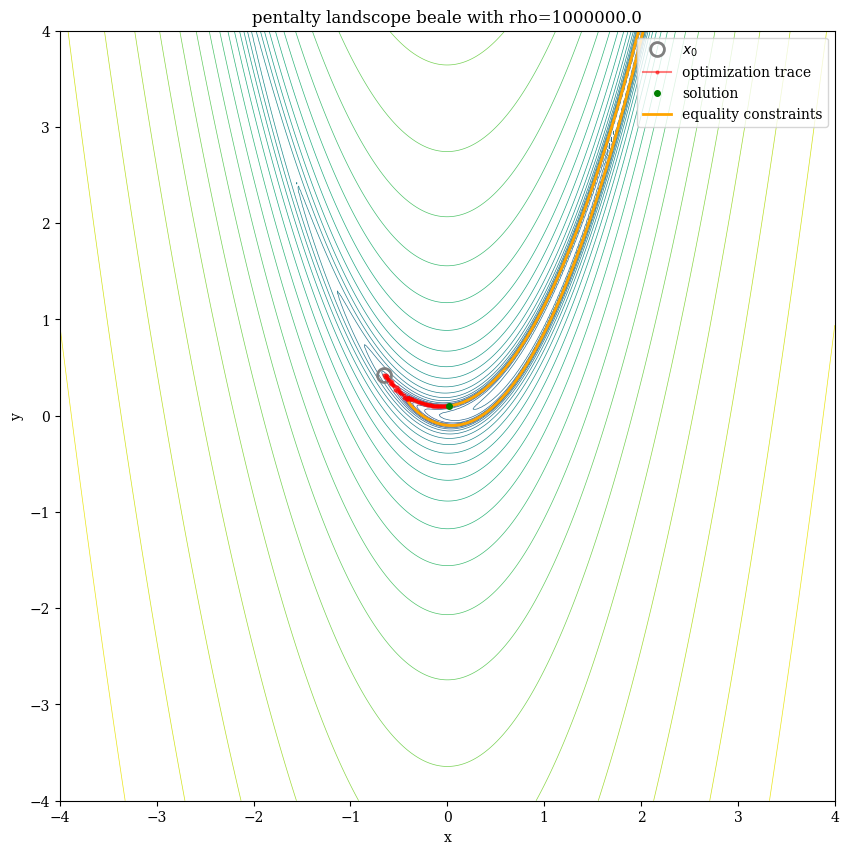

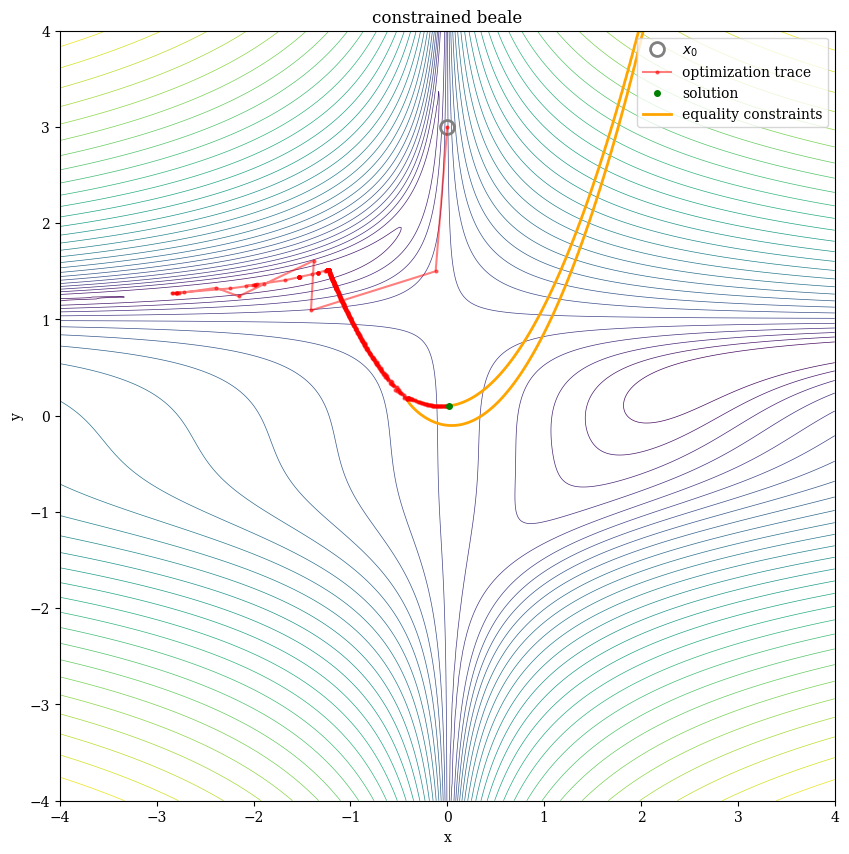

In [7]:
def rosenbrock(x):
    return np.array([1 - x[0,:], 10 * (x[1,:] - x[0,:] ** 2)])

def constraint(x):
    return (rosenbrock(x)[0:1, :]**2 + rosenbrock(x)[1:2,:] **2) * 0.5 - 1

def get_p_beale_fn(rho, constraint_fn):
    def fn(x):
        return np.concatenate([beale(x), rho ** 0.5 * constraint_fn(x)])
    return fn

rho_values = 10**np.linspace(-8, 6, 10)
x = np.array([0.0, 3.0])
whole_trace = [x]

for rho in rho_values:
    fn = get_p_beale_fn(rho, constraint)
    x, sub_trace = mujoco.minimize.least_squares(x, fn)
    subroutine_trace = [t.candidate.squeeze() for t in sub_trace]
    whole_trace.extend(subroutine_trace[1:])
    plot_2D(fn, "pentalty landscope beale with rho="+str(rho), plot_range = plot_range, trace=np.asarray(subroutine_trace), equality_constraints=constraint)

plot_2D(beale, "constrained beale", plot_range = plot_range, trace=np.asarray(whole_trace), equality_constraints=constraint)


### Primal-Dual method

For the penality mehtod, when the $\rho$ is large, the condition number for each sub-rountine problme can be large which make the LM method hard to solve.
Here we introduce Augmented Lagrangian, which is a better version than the penalty method.

Recall the Lagrangian is given by
$$ \mathcal{L}(x,\lambda) = f(x) + \lambda ^T g(x),$$

One way to solve this is problem is using KKT conditions for optimality:
$$\begin{align}
\nabla_x \mathcal{L} = \nabla_x f(x) + \bigg[ \frac{\partial g}{\partial x}\bigg] ^T \lambda &= 0 \nonumber\\ 
g(x) &= 0 \nonumber,
\end{align}$$
which yields a root-finding problem. We can apply Netwon-Raphson to simultaneously find $x$ and dual variable $\lambda$ that satisfying the KKT conditions. The method is known as primal-dual method


Lets' try Newton-Raphson for KKT condition. 

Note in the cell below the hessian is computed analytically. (TODO)We can use also Gaussian-Newton approximate.

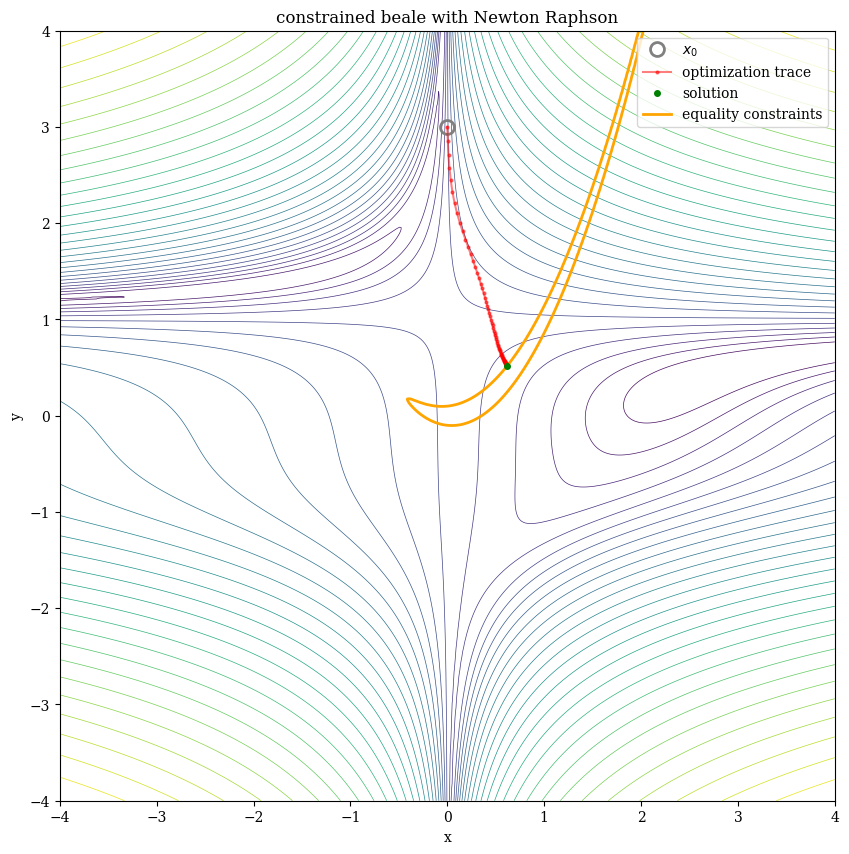

In [8]:
def constraint_jax(x):
    return jnp.sum(rosenbrock_jax(x) **2) / 2 - 1

def lagrangian_jax(x_lam):
    x = x_lam[:-1]
    lam = x_lam[-1]
    return jnp.sum(beale_jax(x) **2) / 2 + lam * constraint_jax(x) 

def KKT_jax(x_lam):
    pLpx = jax.grad(lagrangian_jax)(x_lam)[:-1]
    return jnp.hstack([pLpx, constraint_jax(x_lam[:-1])])

@jax.jit
def newton_raphson_step(x_lam, step_size):
    residual = KKT_jax(x_lam)
    residual_jac = jax.jacobian(KKT_jax)(x_lam)
    
    dx_lam = jnp.linalg.solve(residual_jac, residual)
    return x_lam - step_size * dx_lam

x_lam = jnp.array([0.0, 3.0, 0.0])
step_size = 1e-1

primal_trace = [x_lam[:-1]]

for i in range(100):
    x_lam = newton_raphson_step(x_lam, step_size)
    primal_trace.append(x_lam[:-1])

plot_2D(beale, "constrained beale with Newton Raphson", plot_range = plot_range, trace=np.asarray(primal_trace), equality_constraints=constraint)

### Augmented Lagrangian

Augmented Lagrangian is another method solve the problem. 

According to ChatGPT (TODO: verified this statement), the augmented lagrangian is usually more numerical robust to primal-dual method and preferable for large-scale optimization.

The Augment the Lagrangian in the form of
$$ \mathcal{L}(x,\lambda, \rho) = f(x) + \lambda ^T g(x) + \frac{\rho}{2}\|g(x)\|^2$$
This can be viewed as Lagrangian of the following problem
$$
\begin{align}
\underset{x}{\text{minimize}} \ &f(x) + \frac{\rho}{2} \|g(x)\|^2\nonumber \\
s.t. \ &g(x) = 0 \nonumber \\
\end{align}
$$

The algorithm goes following:

**Step 1**

Treat the Augmented Lagrangian $\mathcal{L}(x,\lambda, \rho)$ as function merely on $x$ and obtain $x_{k+1}$ by finding its minimizer: $$x_{k+1} = \underset{x}{\text{argmin}} \ \mathcal{L}(x,\lambda, \rho)$$

Note since $\lambda$ can be viewed as constant when we only optimize on $x$, it is equivalent to minimize the following objective
$ \begin{align} x_{k+1} &= \underset{x}{\text{argmin}} \ \mathcal{L}(x,\lambda, \rho) \nonumber\\
&= \underset{x}{\text{argmin}} \ \mathcal{L}(x,\lambda, \rho) + \frac{1}{2 \rho} \|\lambda\|^2 \nonumber\\
&= \underset{x}{\text{argmin}} \frac{1}{2} \|r(x)\|^2 + \frac{\rho}{2} \|g(x) + \frac{\lambda}{\rho}\|^2  \nonumber \\
&= \underset{x}{\text{argmin}} \frac{1}{2} \|\begin{bmatrix}r(x) \\ \sqrt{\rho} g(x) + \frac{\lambda}{\sqrt{\rho}}\end{bmatrix}\|^2 \nonumber
\end{align}
$

**Step 2**

Update the multiplier with
$$\lambda_{k+1} = \lambda_k + \rho g(x_{k+1})$$

**Step 3**

Increase $\rho$ if needed, for example

$$
\rho_{k+1} = \begin{cases}
\rho_k \quad \text{if} \|g(x_{k+1})\| < 0.25 \|g(x_k)\|\\
\beta \rho_k \quad \text{otherwise with } \beta > 1
\end{cases}
$$

**Step 4**

Repeated until $\|g(x)\|$ sufficient small

iter: 0    y: 1.01e+05   log10mu: -inf  ratio: 0.94     dx: 1.5      reduction: 9.5e+04
iter: 1    y: 6074       log10mu: -inf  ratio: 0.78     dx: 1.4      reduction: 4.8e+03
iter: 2    y: 1307       log10mu: -inf  ratio: 0.93     dx: 0.55     reduction: 1.2e+03
iter: 3    y: 90.33      log10mu: -inf  ratio: 0.91     dx: 0.17     reduction: 81     
iter: 4    y: 9.029      log10mu: -inf  ratio: 0.84     dx: 0.067    reduction: 7      
iter: 5    y: 1.999      log10mu:  2.6  ratio: 0.048    dx: 0.038    reduction: 0.035  
iter: 6    y: 1.964      log10mu:  2.7  ratio: 0.18     dx: 0.031    reduction: 0.1    
iter: 7    y: 1.864      log10mu:  2.8  ratio: 0.24     dx: 0.019    reduction: 0.06   
iter: 8    y: 1.803      log10mu:  2.9  ratio: 0.38     dx: 0.0086   reduction: 0.023  
iter: 9    y: 1.781      log10mu:  2.9  ratio: 0.41     dx: 0.0026   reduction: 0.0022 
iter: 10   y: 1.778      log10mu:  2.9  ratio: 0.68     dx: 0.0011   reduction: 0.0007 
iter: 11   y: 1.778      log10mu

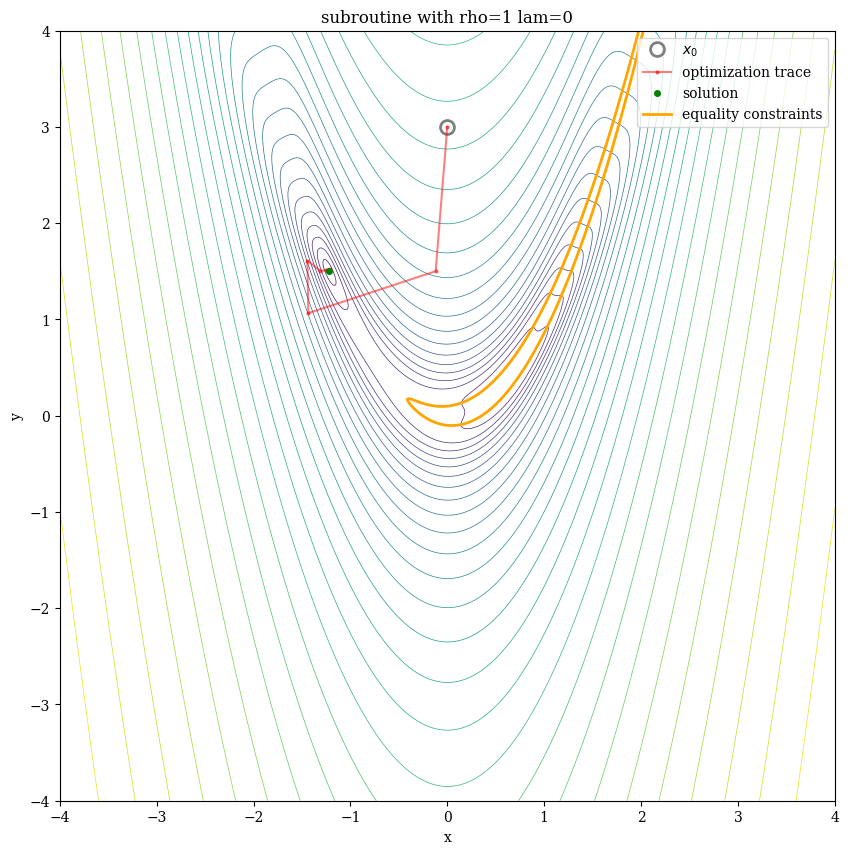

iter: 0    y: 5.036      log10mu:  2.0  ratio: 0.32     dx: 0.0069   reduction: 0.0021 
iter: 1    y: 5.034      log10mu:  3.1  ratio: 0.21     dx: 0.0033   reduction: 0.0029 
iter: 2    y: 5.031      log10mu:  3.2  ratio: 0.39     dx: 0.0017   reduction: 0.0017 
iter: 3    y: 5.03       log10mu:  3.2  ratio: 0.61     dx: 0.00058  reduction: 0.00033
iter: 4    y: 5.029      log10mu:  3.2  ratio: 0.95     dx: 0.00036  reduction: 0.0002 
iter: 5    y: 5.029      log10mu:  3.1  ratio: 1        dx: 0.00038  reduction: 0.00019
iter: 6    y: 5.029      log10mu:  2.9  ratio: 0.91     dx: 0.00061  reduction: 0.00028
iter: 7    y: 5.029      log10mu:  2.5  ratio: 0.9      dx: 0.0011   reduction: 0.00039
iter: 8    y: 5.028      log10mu:  2.8  ratio: 0.078    dx: 0.00082  reduction: 3.4e-05
iter: 9    y: 5.028      log10mu:  3.0  ratio: 0.078    dx: 0.00091  reduction: 6.5e-05
iter: 10   y: 5.028      log10mu:  3.1  ratio: 0.28     dx: 0.00074  reduction: 0.00019
iter: 11   y: 5.028      log10mu

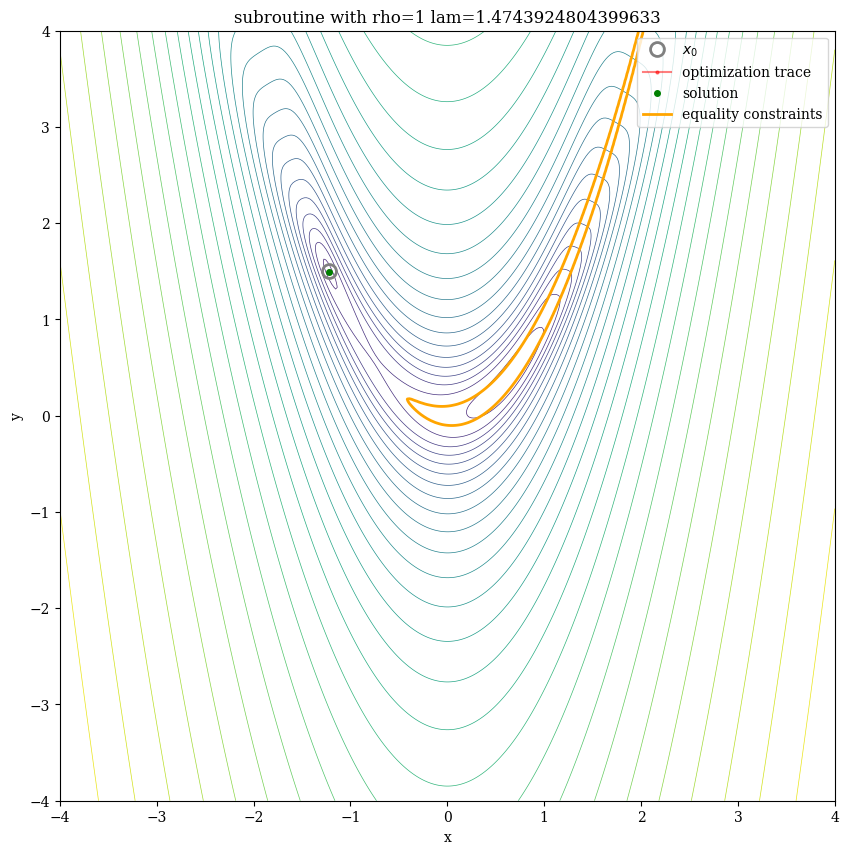

iter: 0    y: 16.14      log10mu:  1.8  ratio: 0.082    dx: 0.08     reduction: 0.057  
iter: 1    y: 16.08      log10mu:  3.8  ratio: 0.18     dx: 0.018    reduction: 0.38   
iter: 2    y: 15.7       log10mu:  3.9  ratio: 0.31     dx: 0.01     reduction: 0.25   
iter: 3    y: 15.45      log10mu:  3.9  ratio: 0.33     dx: 0.004    reduction: 0.043  
iter: 4    y: 15.4       log10mu:  3.9  ratio: 0.42     dx: 0.0018   reduction: 0.01   
iter: 5    y: 15.39      log10mu:  3.9  ratio: 0.7      dx: 0.001    reduction: 0.0056 
iter: 6    y: 15.39      log10mu:  3.9  ratio: 0.94     dx: 0.00079  reduction: 0.0046 
iter: 7    y: 15.38      log10mu:  3.8  ratio: 0.99     dx: 0.00095  reduction: 0.0056 
iter: 8    y: 15.38      log10mu:  3.6  ratio: 1        dx: 0.0015   reduction: 0.0085 
iter: 9    y: 15.37      log10mu:  3.2  ratio: 0.97     dx: 0.0035   reduction: 0.02   
iter: 10   y: 15.35      log10mu:  3.3  ratio: 0.19     dx: 0.0032   reduction: 0.004  
iter: 11   y: 15.35      log10mu

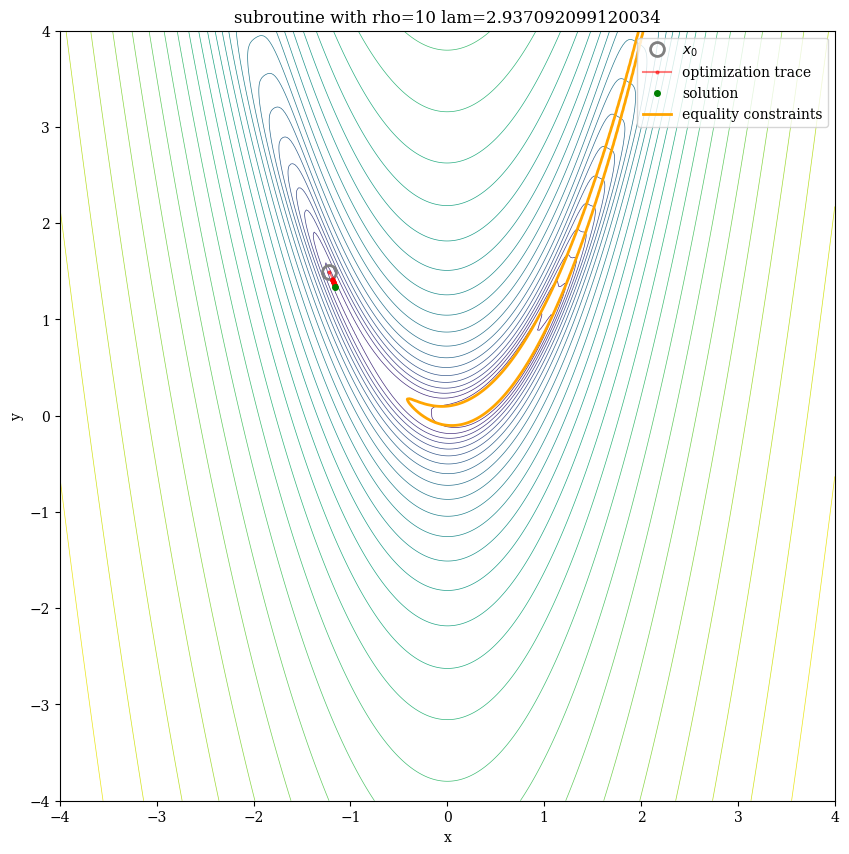

iter: 0    y: 112.4      log10mu:  0.5  ratio: 0.082    dx: 2.5      reduction: 8.9    
iter: 1    y: 103.5      log10mu:  0.6  ratio: 0.77     dx: 0.71     reduction: 78     
iter: 2    y: 25.29      log10mu:  1.0  ratio: 0.023    dx: 0.64     reduction: 0.54   
iter: 3    y: 24.75      log10mu:  1.1  ratio: 0.92     dx: 0.2      reduction: 19     
iter: 4    y: 6.017      log10mu:  1.0  ratio: 1        dx: 0.018    reduction: 1.5    
iter: 5    y: 4.501      log10mu:  1.3  ratio: 0.13     dx: 0.044    reduction: 0.0051 
iter: 6    y: 4.496      log10mu:  1.4  ratio: 0.93     dx: 0.0047   reduction: 0.0034 
iter: 7    y: 4.492      log10mu:  3.2  ratio: 0.063    dx: 5.8e-05  reduction: 3.6e-07
iter: 8    y: 4.492      log10mu:  3.3  ratio: 2        dx: 1e-05    reduction: 6.1e-07
iter: 9    y: 4.492      log10mu:  3.2  ratio: 1.6      dx: 1.3e-05  reduction: 3.9e-07
iter: 10   y: 4.492      log10mu:  3.0  ratio: 0.25     dx: 7.6e-05  reduction: 1.4e-06
iter: 11   y: 4.492      log10mu

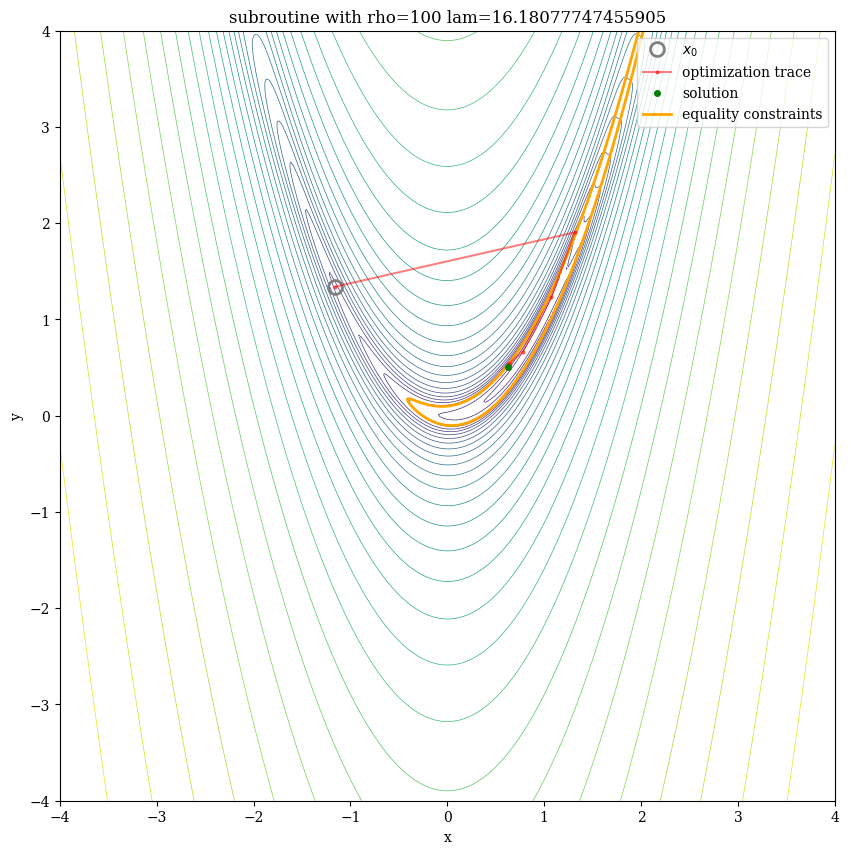

iter: 0    y: 5.879      log10mu:  0.6  ratio: 0.33     dx: 0.15     reduction: 0.48   
iter: 1    y: 5.399      log10mu:  1.0  ratio: 0.38     dx: 0.14     reduction: 0.37   
iter: 2    y: 5.033      log10mu:  1.0  ratio: 0.99     dx: 0.01     reduction: 0.5    
iter: 3    y: 4.532      log10mu:  0.9  ratio: 3.7      dx: 0.0043   reduction: 0.001  
iter: 4    y: 4.531      log10mu:  7.4  ratio: 10       dx: 1.2e-08  reduction: 3.8e-08
Terminated after 4 iterations: norm(dx) < tol. y: 4.531, Residual evals: 154
total time 35.6ms of which residual 90.7%


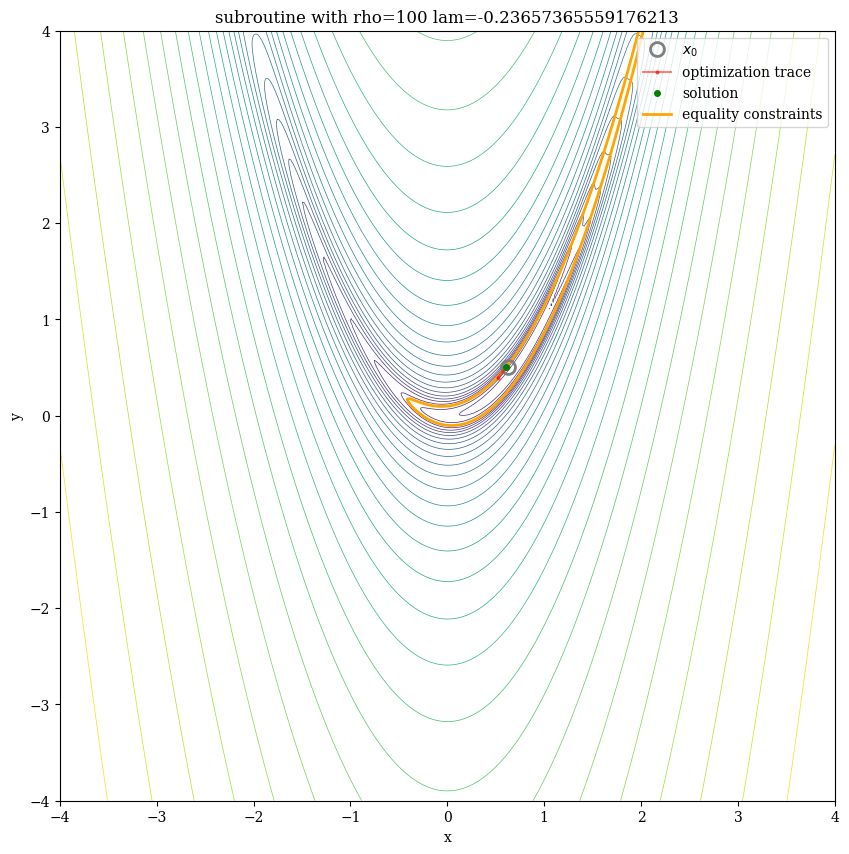

iter: 0    y: 4.531      log10mu:  4.9  ratio: 0.16     dx: 3.4e-06  reduction: 1.6e-07
Terminated after 1 iterations: insufficient reduction. y: 4.531, Residual evals: 147
total time 33.9ms of which residual 90.8%


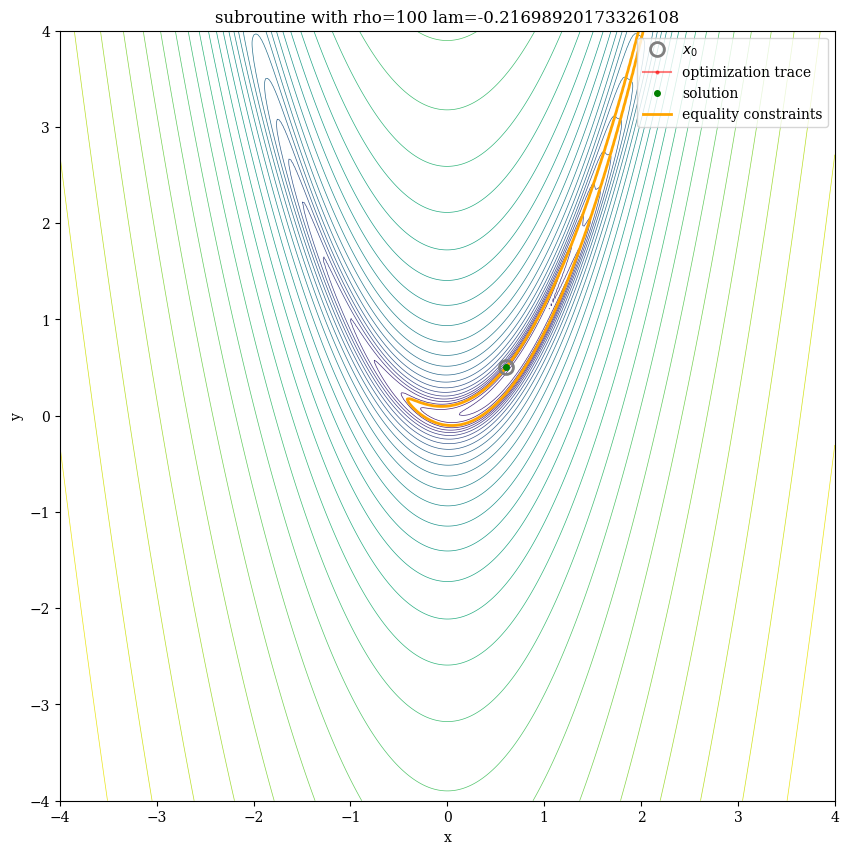

iter: 0    y: 4.531      log10mu:  3.0  ratio: 0.14     dx: 6.5e-05  reduction: 2.4e-06
iter: 1    y: 4.531      log10mu:  3.1  ratio: 0.39     dx: 0.00038  reduction: 6.9e-05
iter: 2    y: 4.531      log10mu:  3.1  ratio: 2.2      dx: 6.4e-05  reduction: 1.2e-05
iter: 3    y: 4.531      log10mu:  3.0  ratio: 0.72     dx: 0.00025  reduction: 4.4e-05
iter: 4    y: 4.531      log10mu:  3.0  ratio: 2.2      dx: 8e-05    reduction: 1.4e-05
iter: 5    y: 4.531      log10mu:  2.8  ratio: 2.5      dx: 0.00011  reduction: 1.9e-05
iter: 6    y: 4.53       log10mu:  2.4  ratio: 0.44     dx: 0.0015   reduction: 0.00025
iter: 7    y: 4.53       log10mu:  4.8  ratio: 0.24     dx: 1.9e-06  reduction: 1.9e-07
iter: 8    y: 4.53       log10mu:  7.3  ratio: 30       dx: 5.9e-09  reduction: 2.1e-08
Terminated after 8 iterations: norm(dx) < tol. y: 4.53, Residual evals: 167
total time 43.0ms of which residual 90.5%


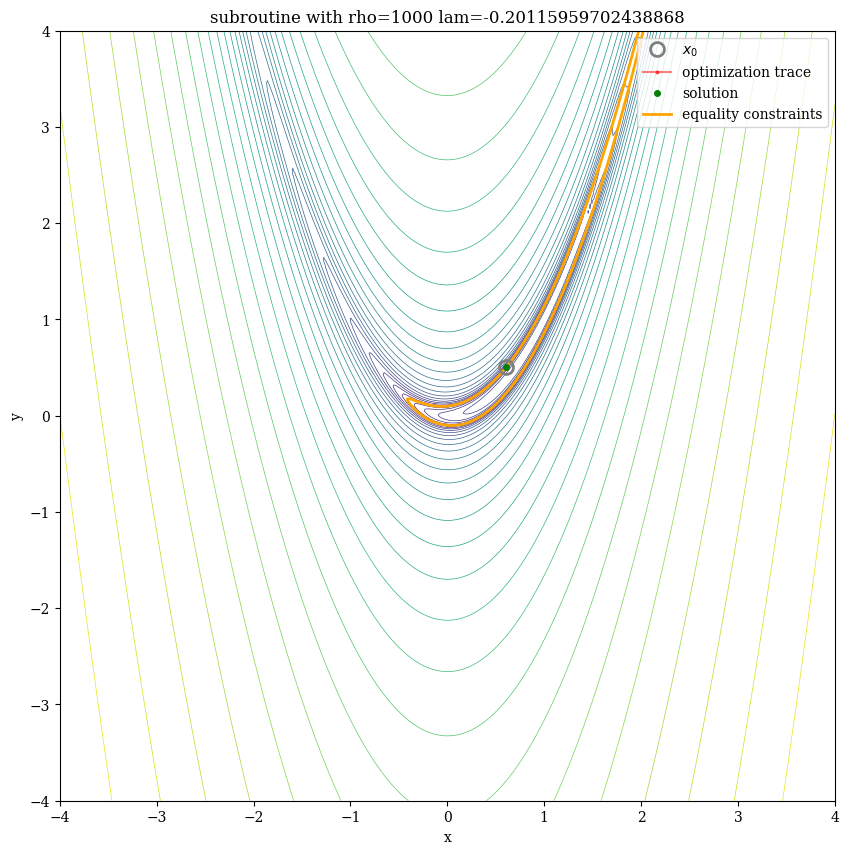

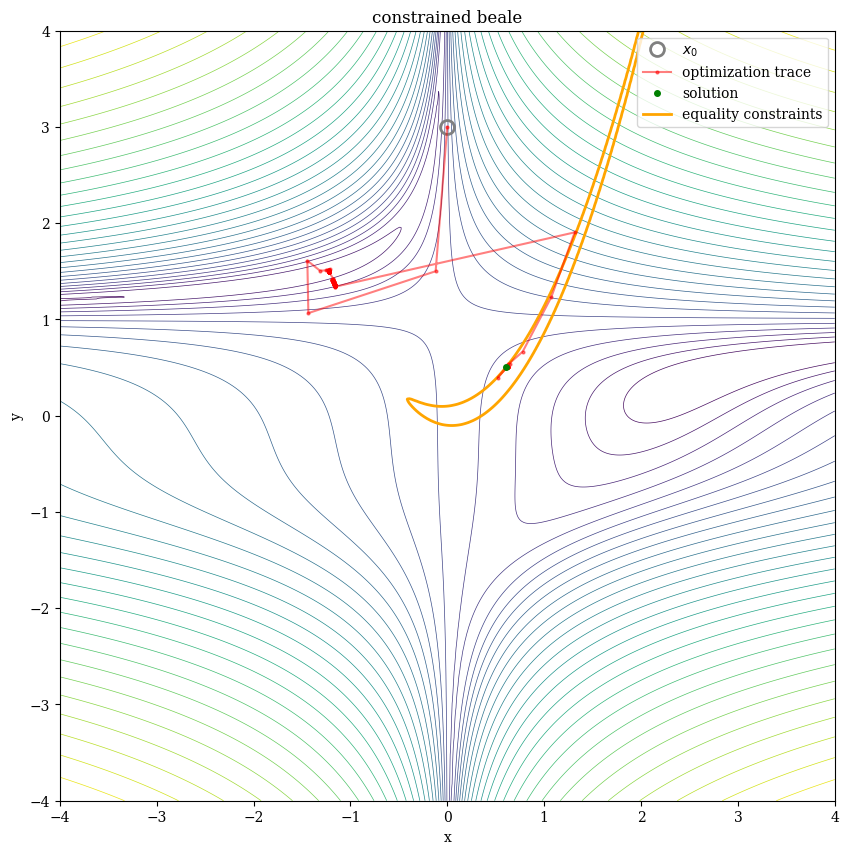

In [9]:
x0 = np.array([0.0, 3.0])
lam0 = 0

def augmented_lagrangian(x0, lam0, obj_fn, constraint_fn, rho=1, beta=10, threshold=1e-5, max_it=int(100), is_show_subroutine=True):

    def get_aug_fn(rho, lam):
        def fn(x):
            return np.concatenate([obj_fn(x), rho ** 0.5 * constraint_fn(x) + lam / rho**0.5])
        return fn
    
    x = x0
    lam = lam0
    g = constraint(x[:, None]).squeeze()

    primal_trace = [x]
    dual_trace = [lam]

    for i in range(max_it):
        # Solve x
        fn = get_aug_fn(rho, lam)
        x, sub_trace = mujoco.minimize.least_squares(x, fn, verbose=int(is_show_subroutine) * mujoco.minimize.Verbosity(mujoco.minimize.Verbosity.ITER).value)
        subroutine_trace = [t.candidate.squeeze() for t in sub_trace]
        primal_trace.extend(subroutine_trace[1:])
        
        # Plot subroutine
        if is_show_subroutine:
            plot_2D(fn, "subroutine with rho="+str(rho) + " lam="+str(lam), plot_range = plot_range, trace=np.asarray(subroutine_trace), equality_constraints=constraint)
        
        # Update dual
        g_next = constraint(x[:, None]).squeeze()
        lam = lam + rho * g_next.squeeze()
        dual_trace.append(lam)

        # Update the penalty
        if abs(g_next) >= abs(g) / 4:
            rho = beta * rho

        g = g_next
        if abs(g) < threshold:
            break

    return x, primal_trace, dual_trace

x, primal_trace, dual_trace = augmented_lagrangian(x0, lam0, beale, constraint)

plot_2D(beale, "constrained beale", plot_range = plot_range, trace=np.asarray(primal_trace), equality_constraints=constraint)


The solution of augmented Lagrangian is sensitive to initialization, let's try to pertubed initialization a little bit

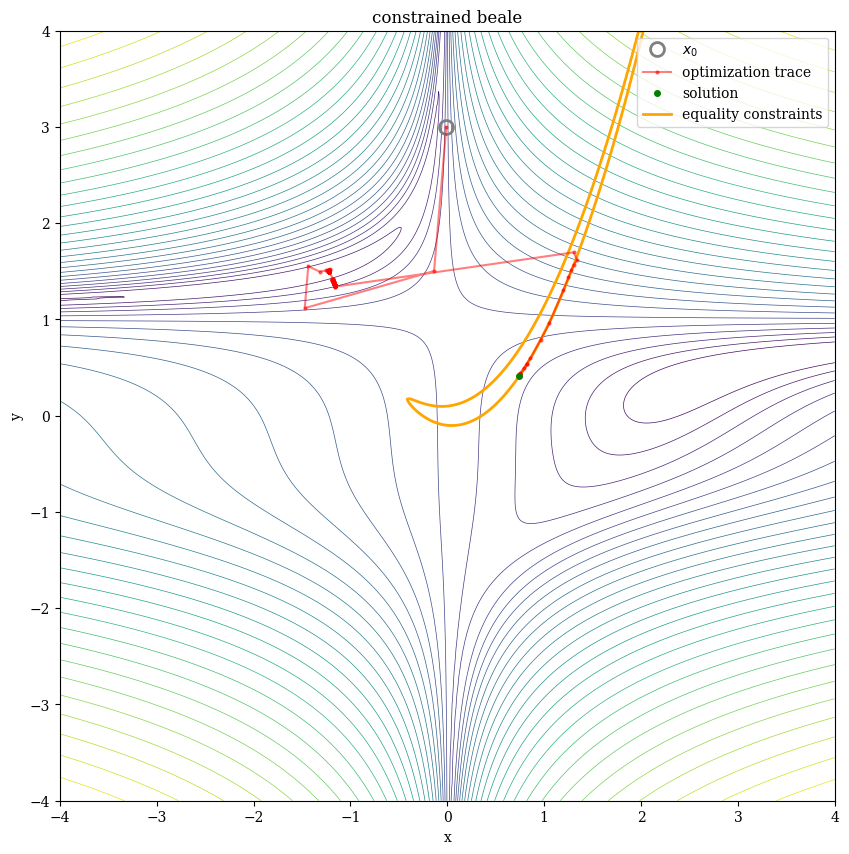

In [10]:
x0 = np.array([-0.01, 3.0])
lam0 = 0

x, primal_trace, dual_trace = augmented_lagrangian(x0, lam0, beale, constraint, is_show_subroutine=False)
plot_2D(beale, "constrained beale", plot_range = plot_range, trace=np.asarray(primal_trace), equality_constraints=constraint)
